# Results

In this notebook we will show the code necessary to produce the figures from the paper.

We start by loading the necessary libraries.

In [26]:
# Standard libraries
import pickle
import os
from math import pi

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import networkx as nx

# Loading the data

In [27]:
# Define the dictionaries that will store the data
resultsDict = dict()
sweepsDict = dict()

# Names of the data sets
datasets = ['German', 'Simulation']

# Operation used for the LP
operations = ['OR', 'AND', 'XOR']

# Cases: individual or combination (MP)
cases = ['ind', 'com']

# We define every possible case
tuples_of_cases = {case: tuple('2V_' + operation + '_' + case + '_1' for operation in operations) for case in cases}
print(tuples_of_cases)

# We store all of our data in the previous two dictionaries
for data in datasets:
    resultsDict[data] = dict()
    sweepsDict[data] = dict()
    for file in os.listdir('results/best/' + data):
        name = file[:-12]

        path_results = 'results/best/' + data + '/' + name + '_best.pickle'
        path_sweeps = 'results/sweep/' + data + '/' + name + '_sweep.pickle'

        with open(path_results, 'rb') as handle:    
            resultsDict[data][name] = pickle.load(handle)
        with open(path_sweeps, 'rb') as handle:
            sweepsDict[data][name] = pickle.load(handle)

names = resultsDict.keys()

{'ind': ('2V_OR_ind_1', '2V_AND_ind_1', '2V_XOR_ind_1'), 'com': ('2V_OR_com_1', '2V_AND_com_1', '2V_XOR_com_1')}


# First steps

We now define some functions that allow us to compare different tables of results.

In [28]:
def tidy_dataset(dataset: pd.DataFrame) -> pd.DataFrame:
    """
    This function compares the metrics obtained with the benchmark (logistic regression).
    ============================================================================================
    Inputs:
        dataset (pd.DataFrame): original data frame with the performance and fairness metrics

    Outputs:
        new_table (pd.DataFrame): new data frame whose columns are expressed as a percentage of the 
    """
    # Copy the table
    new_table = dataset.copy(deep = True)
    
    # Remove the best threshold (we are not interested in this fact)
    colNames = dataset.columns
    subset = [column for column in colNames if column not in ['best_threshold']]
    
    # We express the results as the relative difference with respect to logistic regression
    new_table.loc[:, subset] =  (new_table.loc[:, subset] - new_table.loc['logreg', subset])/new_table.loc['logreg', subset]*100
    return new_table



def compare_tables(dataset1: pd.DataFrame, dataset2: pd.DataFrame) -> pd.DataFrame:
    """
    This function computes the relative difference between two data sets.
    ============================================================================================
    Inputs:
        dataset1 (pd.DataFrame): First dataset.
        dataset2 (pd.DataFrame): Second dataset.

    Outputs:
        new_table (pd.DataFrame): Relative difference of both data sets.
    """

    new_table = dataset1.copy(deep = True) 
    new_table =  (dataset2 - dataset1)/dataset1*100
    return new_table



def obtain_results(name: str) -> list[pd.DataFrame]:
    """
    Compare the performance of the multivariate and univariate cases and compare with benchmark.
    ============================================================================================
    Inputs:
        name (str): original data frame with the performance and fairness metrics

    Outputs:
        comparison_log (pd.DataFrame): data frame which compares the methods of a given data set with logistic regression.
        comparison_pair (pd.DataFrame): data frame obtained as the relative difference of the univariate and multivariate cases.
    """

    # Compare with benchmark
    comparison_log = dict()
    for name in datasets:
        comparison_log[name] = dict()
        for case in resultsDict[name].keys():
            comparison_log[name][case] = tidy_dataset(resultsDict[name][case])

    # Relative difference of univariate and multivariate cases
    comparison_pair = dict()
    for name in datasets:
        comparison_pair[name] = dict() 
        for case in cases:
            comparison_pair[name][case] = dict()
            data1V = name + '1V_' + case + '_1'
            for operation in operations:
                data2V = name + '2V_' + operation + '_' + case + '_1'
                comparison_pair[name][case][operation] = dict()
                comparison_pair[name][case][operation] = compare_tables(resultsDict[name][data1V], resultsDict[name][data2V])

    return comparison_log, comparison_pair

We can now check the comparisons with logistic regression:

In [29]:
new_tables, tables_pairs = obtain_results('German')
with pd.option_context('display.max_rows', None, 'display.max_columns', None, 'float_format', "{:,.2f}".format):  
    display(new_tables['German']['German2V_OR_com_1'])

,best_threshold,bal_acc,acc,independence,separation,sufficiency,auc
logreg,0.80,0.00,0.00,0.00,0.00,0.00,0.00
xgboost,0.68,1.07,10.42,-11.67,-68.63,-51.88,3.58
RW_logreg,0.21,-23.53,7.29,-90.85,-97.11,-38.75,0.31
DI_logreg,0.78,0.71,1.04,4.10,3.42,0.54,0.62
RW_xgboost,0.11,-24.32,8.33,-88.64,-91.29,-40.62,-2.22
DI_xgboost,0.72,1.86,9.37,-55.84,-29.97,-16.36,3.99
RW_adversarial,0.01,-28.69,5.21,-100.00,-100.00,-36.73,-32.85
DI_adversarial,0.86,-22.56,2.08,-84.23,-51.07,-19.74,-38.62
RW_metafair,0.60,-25.45,-18.75,-76.34,-49.97,-7.82,2.20
DI_metafair,0.66,4.86,9.37,5.99,-27.81,-39.41,-1.36


Although a better way of visualizing this data is through a heat map:

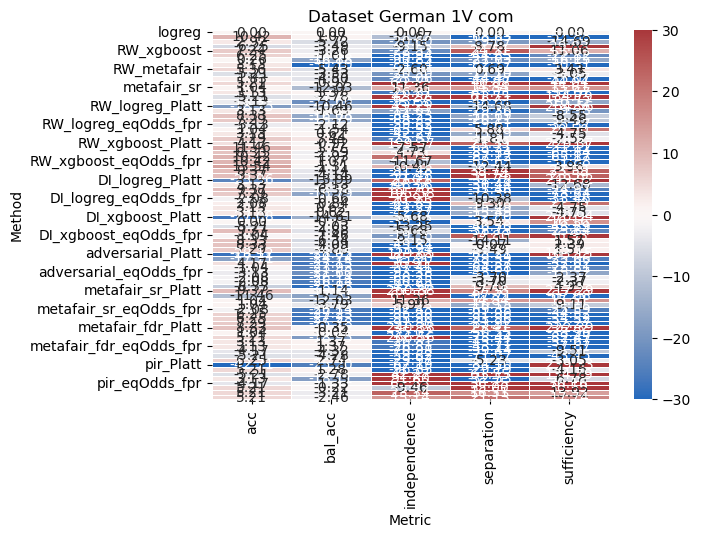

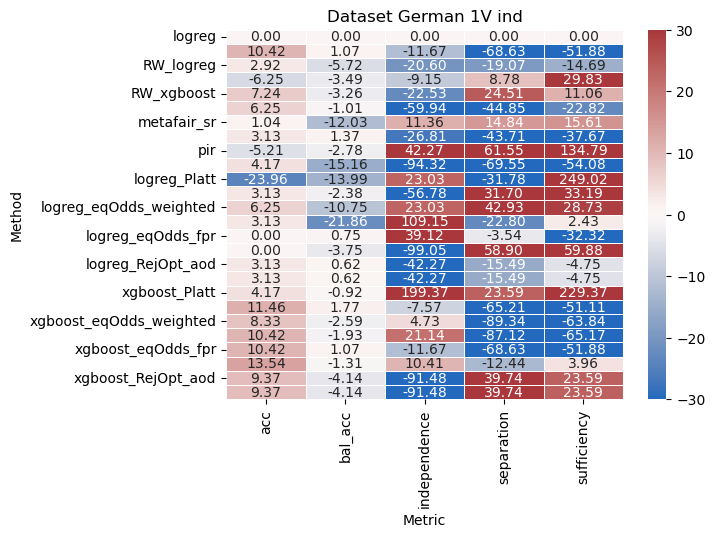

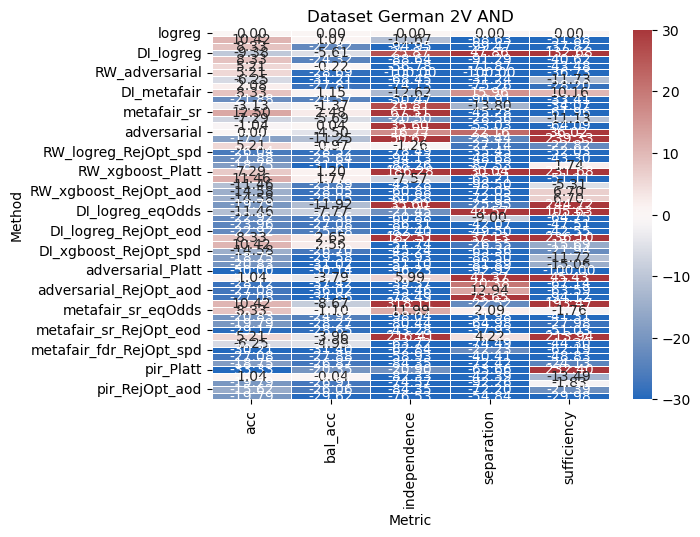

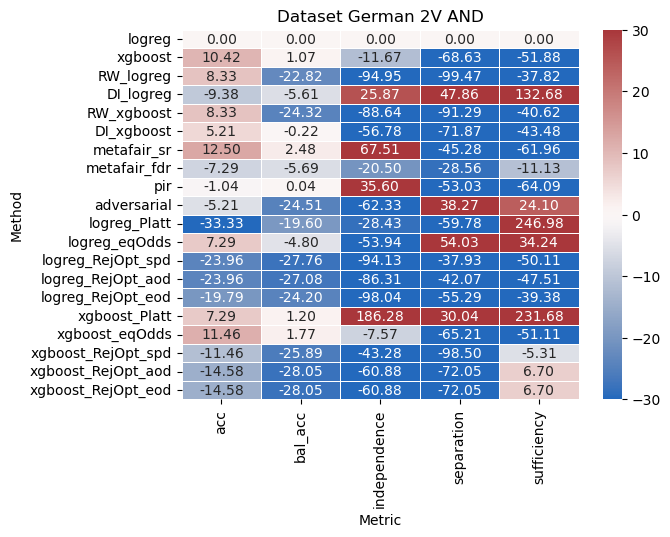

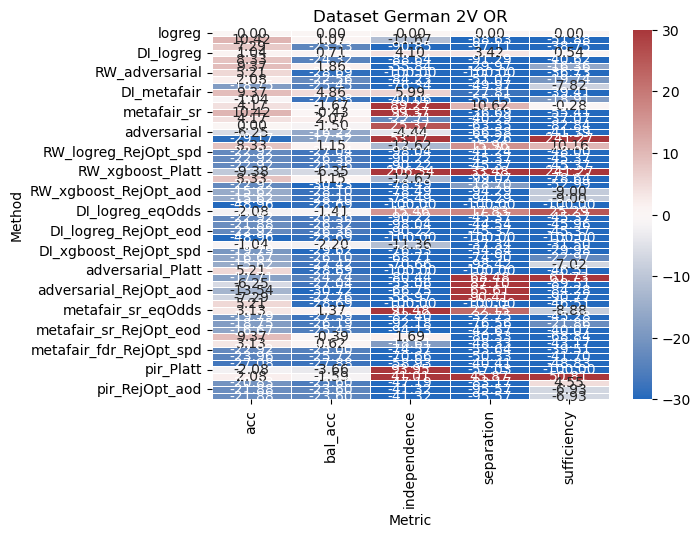

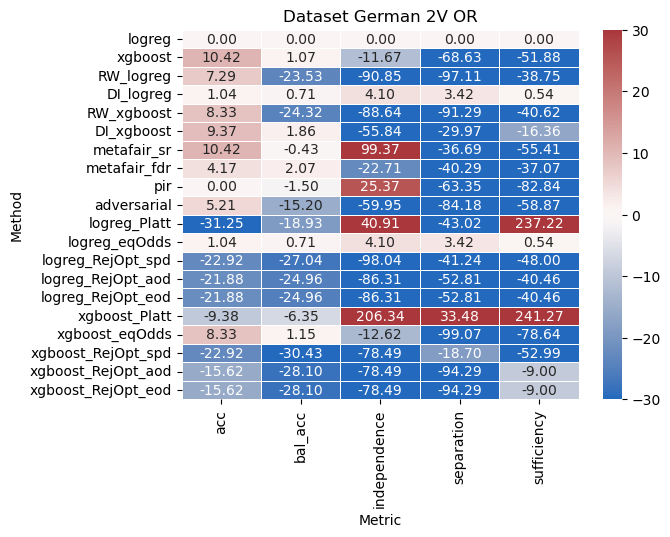

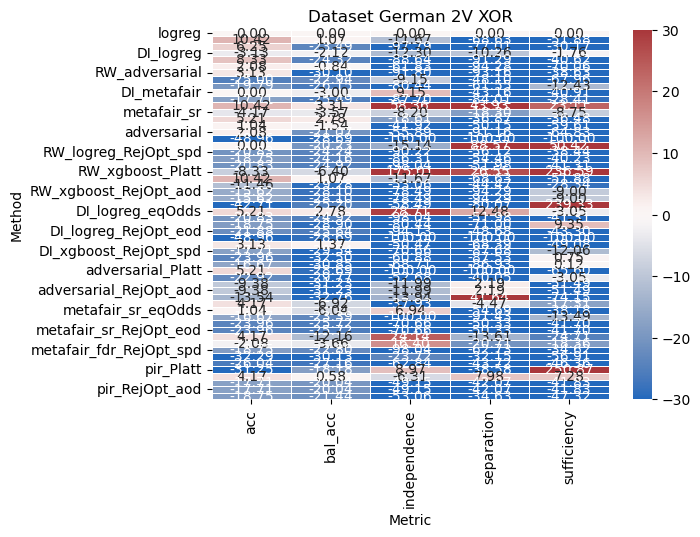

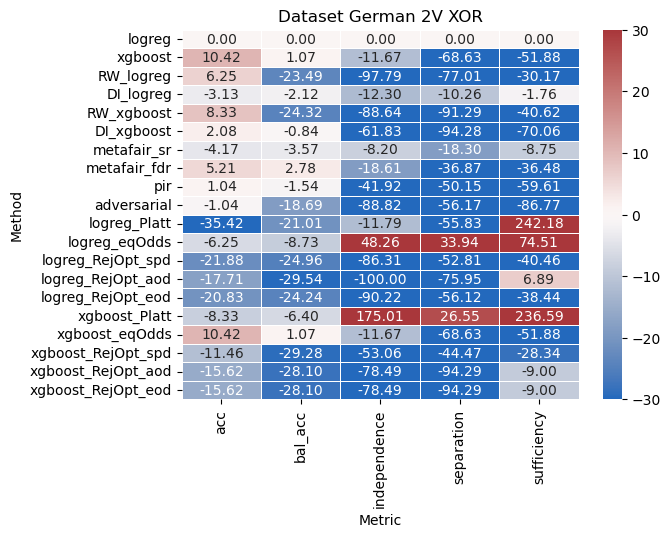

In [30]:
metrics = ['acc', 'bal_acc', 'independence', 'separation', 'sufficiency']
name = 'German'

for case in resultsDict[name].keys():
    ax = sns.heatmap(new_tables[name][case].loc[:, metrics], annot = True, fmt = "0.2f", linewidth=0.5, cmap = "vlag", vmin = -30, vmax = 30)
    ax.set_xlabel('Metric')
    ax.set_ylabel('Method')
    ax.set_title('Dataset ' + name + ' ' + case.split('_')[0][-2:] + ' ' + case.split('_')[1])
    plt.show()

# Pareto efficient frontier

We are now going to show the code for the plots of the pareto efficient frontier

In [31]:
def mix_results() -> tuple[dict]:
    """
    Put all the metrics of the solutions obtained in the same dictionary
    ============================================================================================
    Inputs:
        None

    Outputs:
        total_dict (dict): data set that stores all solutions for each data set.
        concrete_results (dict): sames as total_dict but distinguishes between cases within the same data set.
    """

    # Store all solutions
    total_dict = dict()
    for dataset in resultsDict.keys():
        total_dict[dataset] = dict()
        for case in resultsDict[dataset].keys():
            for method in resultsDict[dataset][case].index:
                for metric in resultsDict[dataset][case].columns:
                    # If the dictionary is empty, create it. Otherwise, add the values of the metrics to the corresponding entry.
                    try:
                        total_dict[dataset][metric] += [resultsDict[dataset][case].loc[method, metric]]
                    except:
                        total_dict[dataset][metric] = [resultsDict[dataset][case].loc[method, metric]]

    # Store the solutions by case
    concrete_result = dict()
    for dataset in resultsDict.keys():
        concrete_result[dataset] = dict()
        for case in resultsDict[dataset].keys():
            concrete_result[dataset][case] = dict()
            for method in resultsDict[dataset][case].index:
                for metric in resultsDict[dataset][case].columns:
                    # If the dictionary does not exist, creat it. Otherwise, add the values of the metrics to the corresponding entry
                    try:
                        concrete_result[dataset][case][metric] += [resultsDict[dataset][case].loc[method, metric]]
                    except:
                        concrete_result[dataset][case][metric] = [resultsDict[dataset][case].loc[method, metric]]

    return total_dict, concrete_result




def compute_frontier(coord1: np.ndarray, coord2: np.ndarray, isMax: bool = True, accMax: bool = True) -> np.ndarray:
    """
    Given a set of solutions and two coordinates associated by them, compute the Pareto efficient frontier
    ======================================================================================================
    Inputs:
        coord1 (np.array): First coordinate for which we want to compute the frontier (x axis).
        coord2 (np.array): Second coordinate for which we want to compute the frontier (y axis).
        isMax (bool): if true, the optimal value of coord2 is computed using the maximum. Otherwise, we use the minimum.
        accMax (bool): if true, the frontier is computed using the cumulative maximum. Otherwise, we use the cumulative minimum.


    Outputs:
        cum_sorted_frontier (np.array): data set that the optimal value of coord2 for each value (sorted) of coord1.
    """

    # Initialize the array that will store the frontier
    frontier = np.zeros(np.shape(coord1)) 

    # We chosse either the maximum or the minimum to compute the optimal solutions
    if isMax:
        orderFun = np.max
    else:
        orderFun = np.min

    # We choose either the cumulative maximum or the cumulative minimum to compute the frontier
    if accMax:
        accFun = np.maximum.accumulate
    else:
        accFun = np.minimum.accumulate

    # Computation of the frontier
    for value in coord1:
        # For each values of coord 1 we compute the maximum/minimum in coord2 to obtain the best possible value of coord2 for every value of coord1
        index = np.where(coord1 == value)
        optim = orderFun(coord2[index])
        frontier[index] = optim
    # Sort the the values according to coord1 (which will be the x axis once we make the plot) and compute the cumulative maximum/minimum
    # The result is the Pareto efficient frontier
    sorted_frontier = np.array([x for _,x in sorted(zip(coord1, frontier))])
    cum_sorted_frontier = accFun(sorted_frontier)
    return cum_sorted_frontier




def plot_pareto(sweeps: pd.DataFrame, metric1_name: str, metric2_name: str, isMax: bool = True, accMax: bool = True):
    """
    Plot the Pareto efficient frontier of two metrics metric1 and metric2
    ======================================================================================================
    Inputs:
        sweeps (pd.DataFrame): data frame that stores the values for both metrics.
        coord1 (np.array): Name of the first metric (x axis).
        coord2 (np.array): Name of the second metric (y axis).
        isMax (bool): if true, the optimal value of coord2 is computed using the maximum. Otherwise, we use the minimum.
        accMax (bool): if true, the frontier is computed using the cumulative maximum. Otherwise, we use the cumulative minimum.

    Outputs:
        fig, ax (plt.figure, plt.axes): plt objects that store the plot we produce.
    """

    # Obtain the arrays for both metrics and transform them to numpy arrays
    metric1 = sweeps[metric1_name]
    metric2 = sweeps[metric2_name]
    metric1_np = np.copy(np.array(metric1))
    metric2_np = np.copy(np.array(metric2))
    
    # Compute the Pareto efficient frontier
    cum_sorted_frontier = compute_frontier(metric1_np, metric2_np, isMax, accMax)

    # Add the origin to the frontier
    cum_sorted_frontier = np.concatenate(([0], cum_sorted_frontier))
    metric1_np = np.concatenate(([0], metric1_np))
    
    # Plot the Pareto efficient frontier
    fig, ax = plt.subplots()
    ax.set_title('Trade offs')
    ax.set_xlabel(metric1_name)
    ax.set_ylabel(metric2_name)
    indices = np.concatenate(([True], np.diff(cum_sorted_frontier) != 0))
    ax.scatter(np.sort(metric1_np)[indices], cum_sorted_frontier[indices], s = 50, color = 'red', edgecolors = 'black', zorder = 1)
    ax.step(np.sort(metric1_np), cum_sorted_frontier, color = 'black', ls = ':', linewidth = 2, zorder = 0)


    return fig, ax

The results are the following figures:

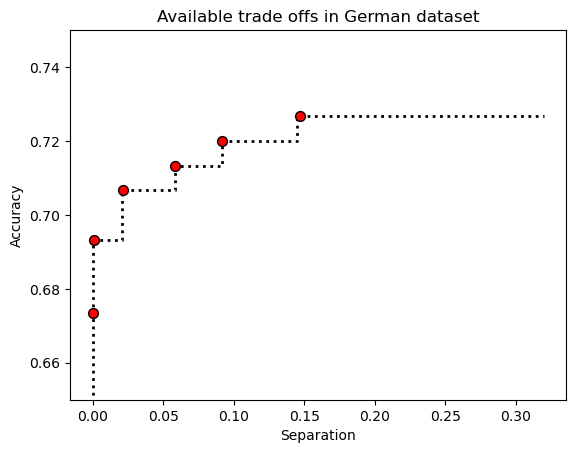

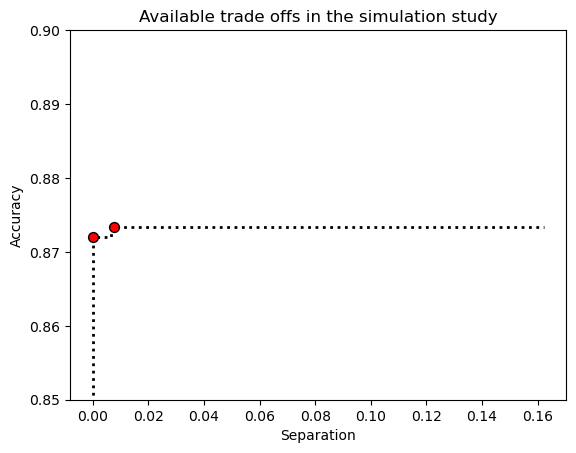

In [32]:
total_dict, concrete_result = mix_results()

fig, ax = plot_pareto(total_dict['German'], 'separation', 'acc')
ax.set_title("Available trade offs in German dataset")
ax.set_ylim((0.65, 0.75))
ax.set_ylabel('Accuracy')
ax.set_xlabel('Separation')
plt.show()
fig.savefig('results/Figures/pareto/pareto_German')


fig, ax = plot_pareto(total_dict['Simulation'], 'separation', 'acc')
ax.set_title("Available trade offs in the simulation study")
ax.set_ylim((0.85, 0.9))
ax.set_ylabel('Accuracy')
ax.set_xlabel('Separation')
plt.show()
fig.savefig('results/Figures/pareto/pareto_Simulation')

We can visualize the Pareto efficient frontier for each individual case:

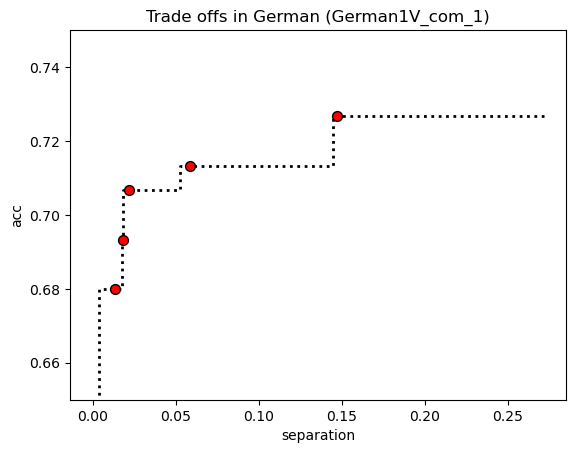

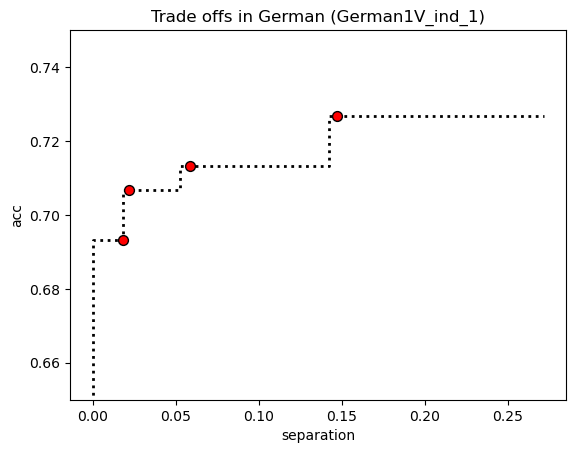

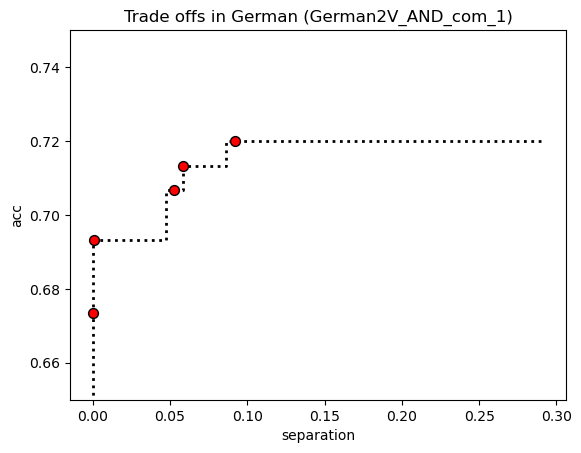

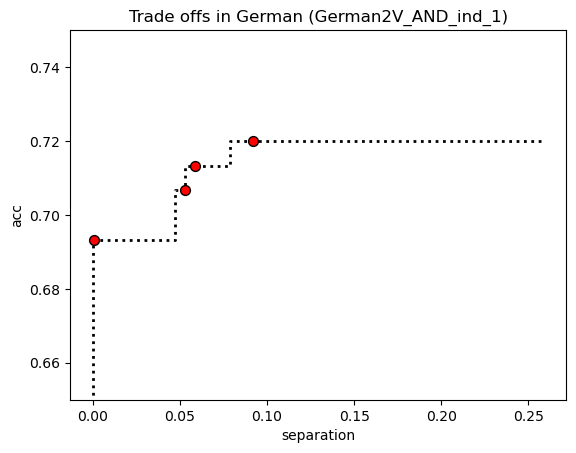

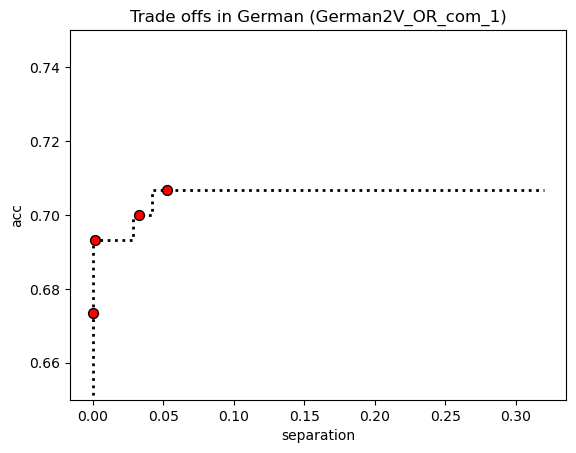

...

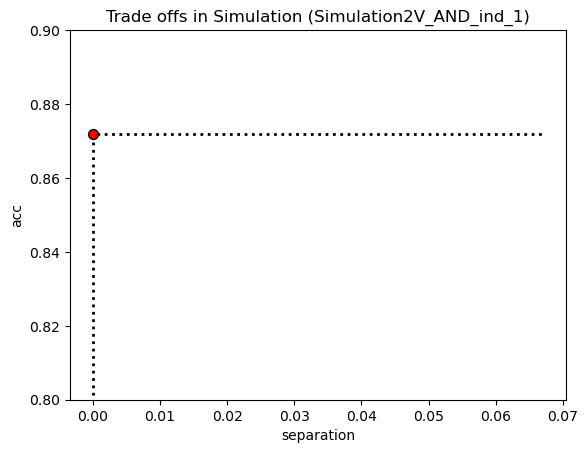

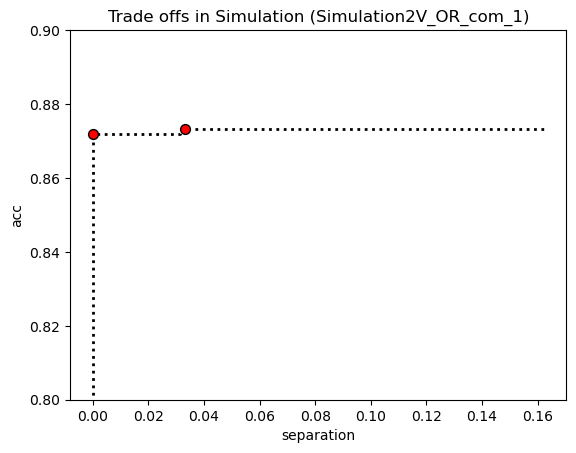

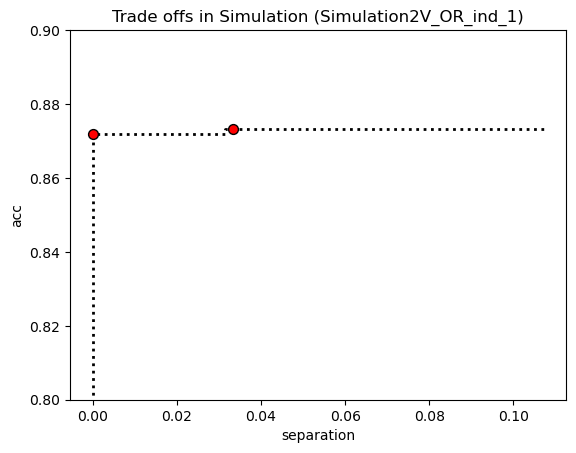

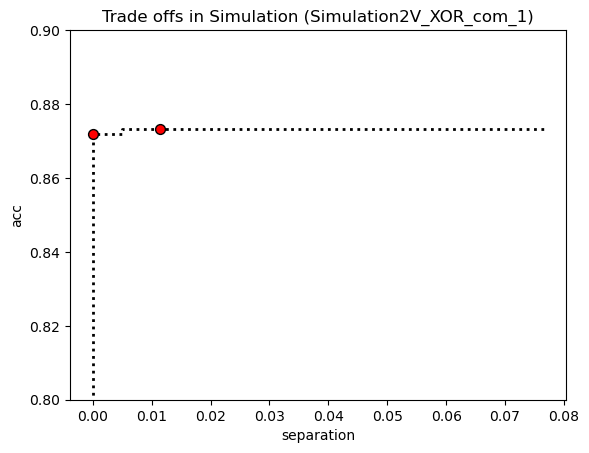

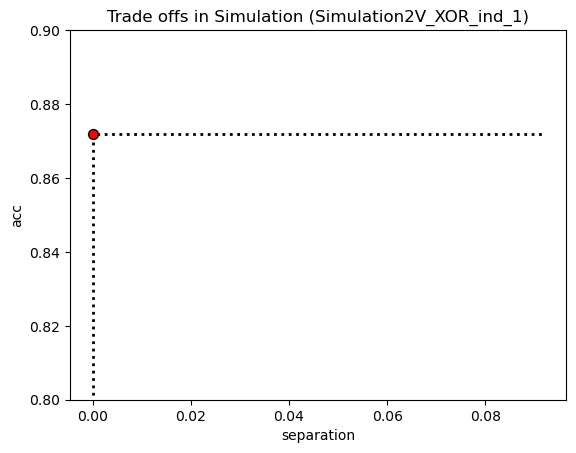

In [33]:
for dataset in datasets:
    for case in sweepsDict[dataset]:
        fig, ax = plot_pareto(concrete_result[dataset][case], 'separation', 'acc')
        if dataset == 'German':
            ax.set_ylim((0.65, 0.75))
        else:
            ax.set_ylim((0.8, 0.9))
        ax.set_title("Trade offs in " + dataset + " (" + case + ")")

# Heatmap plot

We now show how to generate the heatmaps we used to visualize the performance of the methods.

In [34]:
# Name of the processors
preproc = ['RW', 'DI']
inproc = ['metafair', 'pir', 'adversarial']
postproc = ['Platt', 'eqOdds', 'RejOpt']
proc = preproc + inproc + postproc

# Names that should be used in case one method appears individually (i.e. we put logistic regreesion for pre processors)
default_labels = {
    'RW': 'RW_logreg',
    'DI': 'DI_logreg',
    'adversarial': 'adversarial',
    'metafair': 'metafair_sr',
    'pir': 'pir',
    'Platt': 'Platt',
    'eqOdds': 'eqOdds',
    'RejOpt': 'RejOpt_spd'
    }


def combination_matrix(resultsInd: pd.DataFrame, resultsCom: pd.DataFrame) -> dict[pd.DataFrame]:
    """
    Store results of individual and combined performance in the same data frame
    ======================================================================================================
    Inputs:
        resultsInd (pd.DataFrame): Data frame that stores the results of the individual methods.
        resultsCom (pd.DataFrame): Data frame that stores the results of the MP processors.

    Outputs:
        matrices (dict): dictionary whose entries are a data frame for each metric which stores the combined
            results for each one.
    """

    # Create the dictinoary
    matrices = dict()
    # Select metrics
    metrics = ['acc', 'bal_acc', 'independence', 'separation', 'sufficiency']
    # Initialize the reuslts of each metric as an empty data frame
    for metric in metrics:
        matrices[metric] = pd.DataFrame(np.nan, index=proc, columns=proc)

    # Iterate to generate the matric
    for index1 in proc:
        for index2 in proc:
            # Illegal combinations:
            # We use this iteration to store the results of individual methods.
            # We store the results of index1.
            if \
                (index1 in preproc and index2 in preproc) or \
                (index1 in inproc and index2 in inproc) or \
                (index1 in postproc and index2 in postproc):

                # Select the correct name
                if index1 in postproc:
                    nameUse = 'logreg_' + default_labels[index1]
                else:
                    nameUse = default_labels[index1]

                # Store individual results
                for metric in metrics:
                    matrices[metric].loc[index1, index2] = resultsInd.loc[nameUse, metric]

            # Allowed combinations
            else:
                
                # If the entry is empty:
                if np.isnan(matrices[metric].loc[index1, index2]):
                    # Use the correct name
                    if (index1 in preproc and index2 in inproc):
                        method_name = index1 + '_' + index2
                    else:
                        method_name = default_labels[index1] + '_' + default_labels[index2]                    
                    
                    # Store the combined performance in [index1, index2] and [index2, index1].
                    for metric in metrics:
                        matrices[metric].loc[index1, index2] = resultsCom.loc[method_name, metric]
                        matrices[metric].loc[index2, index1] = resultsCom.loc[method_name, metric]
                    
    return matrices


def plot_heat_combination_matrix(resultsInd: pd.DataFrame, resultsCom: pd.DataFrame, metric: str):
    """
    Heatmap plot that shows the performance of the combination of methods
    ======================================================================================================
    Inputs:
        resultsInd (pd.DataFrame): Data frame that stores the results of the individual methods.
        resultsCom (pd.DataFrame): Data frame that stores the results of the MP processors.
        metric (str): Name of the metric we are interested in visualizing.

    Outputs:
        fig, ax (plt.figure, plt.axes): plt objects that store the plot we produce.
    """

    # Obtain the matrix with the joint performances and save the one we are interested in
    matrices = combination_matrix(resultsInd, resultsCom)
    matrix_metric = matrices[metric]

    # Create the figure
    fig, ax = plt.subplots()

    # Create the mask necessary to erase repeated results and illegal combinations (e.g. combinations of two pre processors)
    mask = np.triu(np.ones_like(matrix_metric, dtype=bool), k = 1)
    mask[0:2, 0:2] = True
    mask[2:5, 2:5] = True
    mask[5:, 5:] = True
    np.fill_diagonal(mask, False)

    # Create color map
    cmap = "mako"
    norm = plt.Normalize(vmin=0, vmax=1)

    # Create the heatmap
    sns.heatmap(
        matrix_metric,
        mask = mask,
        annot = True,
        fmt = "0.2f",
        linewidth=0.5,
        ax = ax,
        cmap = cmap,
        norm = norm
        )
    
    # Put labels and colorbar
    ax.set_xlabel("Fairness processor")
    ax.set_ylabel("Fairness processor")
    ax.collections[0].colorbar.set_label(metric)
    return fig, ax

We can now generate the performance heatmaps using the following code:

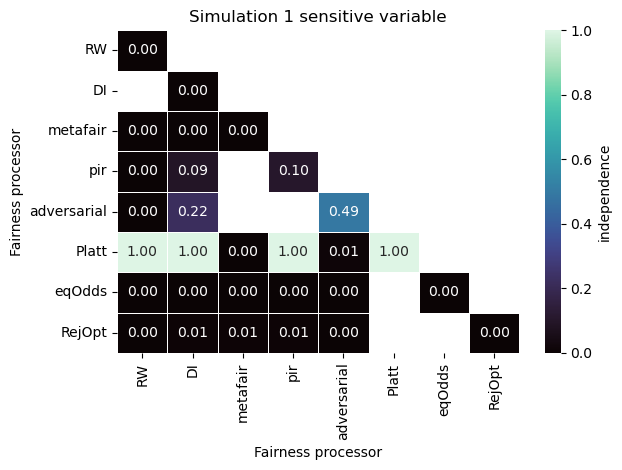

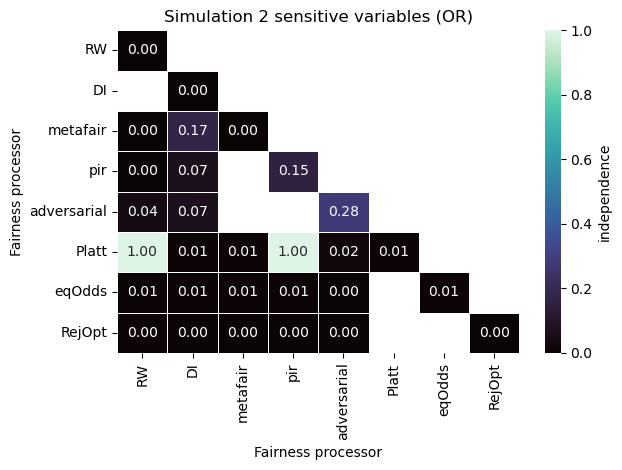

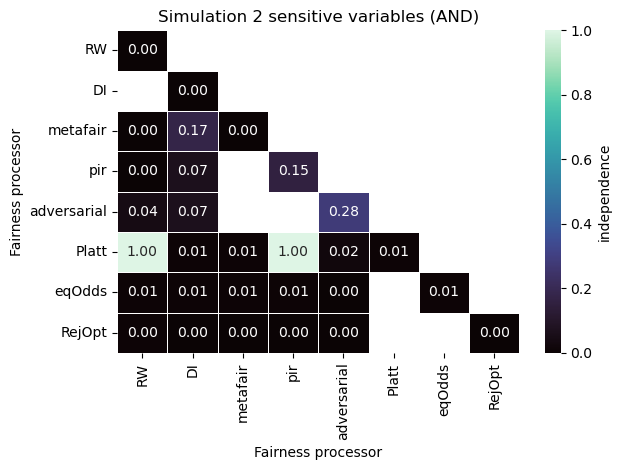

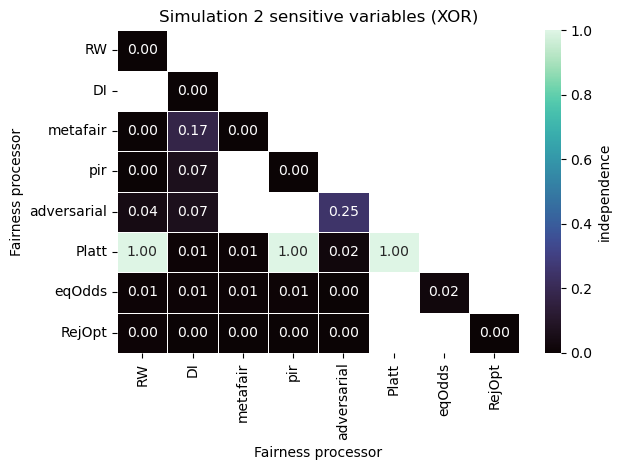

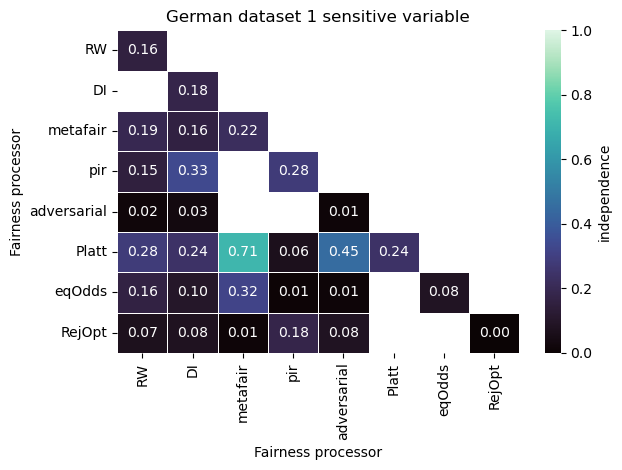

...

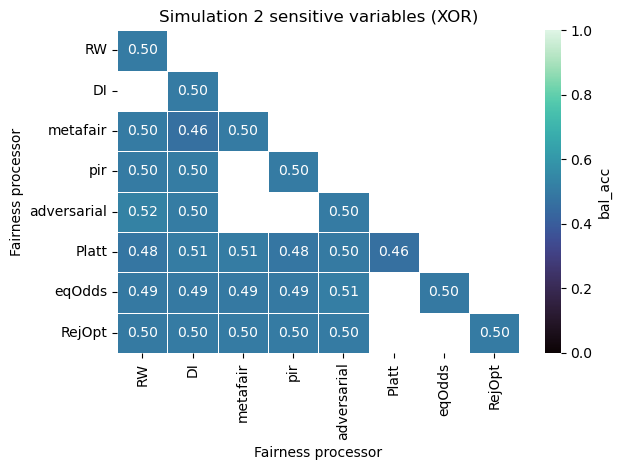

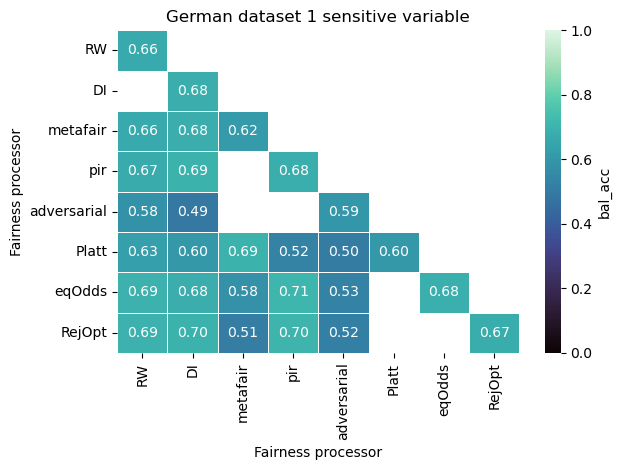

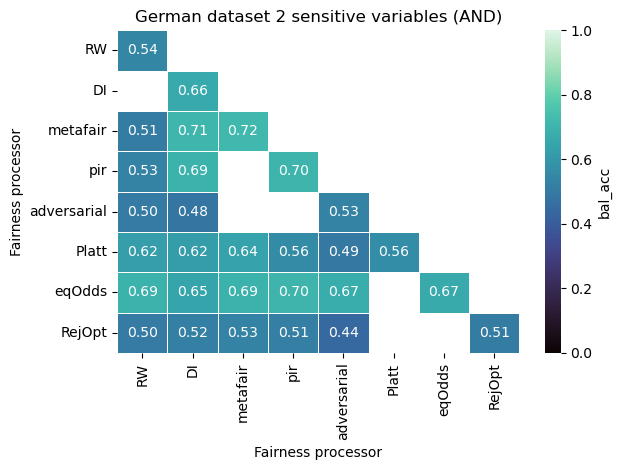

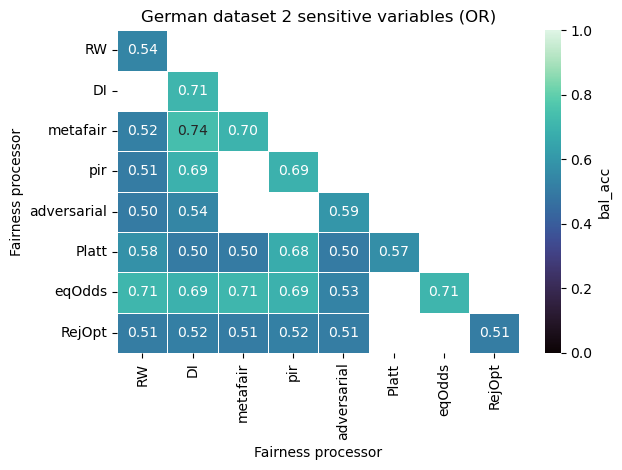

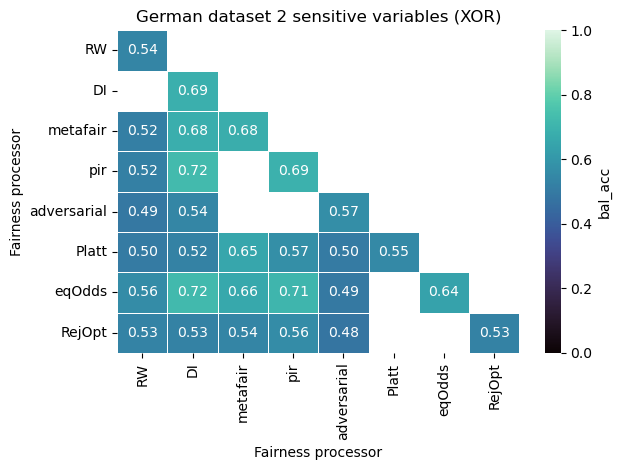

In [35]:
metrics = ['independence', 'separation', 'sufficiency', 'acc', 'bal_acc']

for metric in metrics:
    
    fig, ax = plot_heat_combination_matrix(resultsDict['Simulation']['Simulation1V_ind_1'], resultsDict['Simulation']['Simulation1V_com_1'], metric)
    ax.set_title("Simulation 1 sensitive variable")
    plt.tight_layout()
    plt.show()
    fig.savefig('results/Figures/performance_matrix/' + metric + '/Simul1V_' + metric + '.png')

    fig, ax = plot_heat_combination_matrix(resultsDict['Simulation']['Simulation2V_OR_ind_1'], resultsDict['Simulation']['Simulation2V_OR_com_1'], metric)
    ax.set_title("Simulation 2 sensitive variables (OR)")
    plt.tight_layout()
    plt.show()
    fig.savefig('results/Figures/performance_matrix/' + metric + '/Simul2V_OR_' + metric + '.png')

    fig, ax = plot_heat_combination_matrix(resultsDict['Simulation']['Simulation2V_OR_ind_1'], resultsDict['Simulation']['Simulation2V_OR_com_1'], metric)
    ax.set_title("Simulation 2 sensitive variables (AND)")
    plt.tight_layout()
    plt.show()
    fig.savefig('results/Figures/performance_matrix/' + metric + '/Simul2V_AND_' + metric + '.png')

    fig, ax = plot_heat_combination_matrix(resultsDict['Simulation']['Simulation2V_XOR_ind_1'], resultsDict['Simulation']['Simulation2V_OR_com_1'], metric)
    ax.set_title("Simulation 2 sensitive variables (XOR)")
    plt.tight_layout()
    plt.show()
    fig.savefig('results/Figures/performance_matrix/' + metric + '/Simul2V_XOR_' + metric + '.png')

    fig, ax = plot_heat_combination_matrix(resultsDict['German']['German1V_ind_1'], resultsDict['German']['German1V_com_1'], metric)
    ax.set_title("German dataset 1 sensitive variable")
    plt.tight_layout()
    plt.show()
    fig.savefig('results/Figures/performance_matrix/' + metric + '/German1V_' + metric + '.png')

    fig, ax = plot_heat_combination_matrix(resultsDict['German']['German2V_AND_ind_1'], resultsDict['German']['German2V_AND_com_1'], metric)
    ax.set_title("German dataset 2 sensitive variables (AND)")
    plt.tight_layout()
    plt.show()
    fig.savefig('results/Figures/performance_matrix/' + metric + '/German2V_AND_' + metric + '.png')

    fig, ax = plot_heat_combination_matrix(resultsDict['German']['German2V_OR_ind_1'], resultsDict['German']['German2V_OR_com_1'], metric)
    ax.set_title("German dataset 2 sensitive variables (OR)")
    plt.tight_layout()
    plt.show()
    fig.savefig('results/Figures/performance_matrix/' + metric + '/German2V_OR_' + metric + '.png')

    fig, ax = plot_heat_combination_matrix(resultsDict['German']['German2V_XOR_ind_1'], resultsDict['German']['German2V_XOR_com_1'], metric)
    ax.set_title("German dataset 2 sensitive variables (XOR)")
    plt.tight_layout()
    plt.show()
    fig.savefig('results/Figures/performance_matrix/' + metric + '/German2V_XOR_' + metric + '.png')

# Radar plot

We now show how to create radar plot to better observe the interaction between methods.

In [36]:
def plot_radar(resultsInd: pd.DataFrame, resultsCom: pd.DataFrame, method1: str, method2: str):
    """
    Radar plot that shows the performance of two methods and their combination
    ======================================================================================================
    Inputs:
        resultsInd (pd.DataFrame): Data frame that stores the results of the individual methods.
        resultsCom (pd.DataFrame): Data frame that stores the results of the MP processors.
        method1 (str): Name of the method that acts first in the ML pipeline.
        method2 (str): Name of the method that acts last in the ML pipeline.

    Outputs:
        fig, ax (plt.figure, plt.axes): plt objects that store the plot we produce.
    """

    # Labels that we need to use for individual methods (i.e. use logistic regression in pre and post processing)
    default_labels = {
        'RW': 'RW_logreg',
        'DI': 'DI_logreg',
        'adversarial': 'adversarial',
        'metafair': 'metafair_sr',
        'pir': 'pir',
        'Platt': 'logreg_Platt',
        'eqOdds': 'logreg_eqOdds',
        'RejOpt': 'logreg_RejOpt_spd',
        'RejOpt_aod': 'logreg_RejOpt_aod'
        }

    # Assign the correct name to the combination of processors
    if \
        (method1 in preproc and method2 in inproc) or \
        (method1 in inproc and method2 in postproc):
        com_name = method1 + '_' + method2
    else:
        com_name = default_labels[method1] + '_' + default_labels[method2]  

    # Metrics that will be used in the radar graph
    cathegories = ['acc', 'bal_acc', 'independence', 'separation', 'sufficiency']

    # Dictionaries that will store the values for these metrics
    values = dict()
    values[method1] = dict()
    values[method2] = dict()
    values[com_name] = dict()

    # Store the values of each metrics. Append the first value at the end to make the correct circular graph
    values[method1] = resultsInd.loc[default_labels[method1], cathegories].tolist() + [resultsInd.loc[default_labels[method1], cathegories][0]]
    values[method2] = resultsInd.loc[default_labels[method2], cathegories].tolist() + [resultsInd.loc[default_labels[method2], cathegories][0]] 
    values[com_name] = resultsCom.loc[com_name, cathegories].tolist() + [resultsCom.loc[com_name, cathegories][0]]

    # Compute the angles of the polar graph
    N = len(cathegories)
    angles = [n / float(N) * 2 * pi for n in range(N)] + [0]

    # Create the plot
    fig, ax = plt.subplots(figsize=(6, 6), subplot_kw={'projection': 'polar'})
    ax.set_ylim(0, 1)
    ax.plot(angles, values[method1], label=method1, linewidth=3, alpha = 0.95, color = "#4169E1")
#    ax.fill(angles, values[method1], alpha=0.25)
    ax.plot(angles, values[method2], label=method2, linewidth=3, alpha = 0.95, color = "#f19600")
#    ax.fill(angles, values[method2], alpha=0.25)
    ax.plot(angles, values[com_name], label="combination", linewidth=3, alpha = 0.95, color = "#85006c")
#    ax.fill(angles, values[com_name], alpha=0.25)

    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(cathegories)
    plt.legend()
    return fig, ax

We can now plot our results.

C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  values[method1] = resultsInd.loc[default_labels[method1], cathegories].tolist() + [resultsInd.loc[default_labels[method1], cathegories][0]]
C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  values[method2] = resultsInd.loc[default_labels[method2], cathegories].tolist() + [resultsInd.loc[default_labels[method2], cathegories][0]]
C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:48: FutureWarning: Series.__getitem__ treating ke

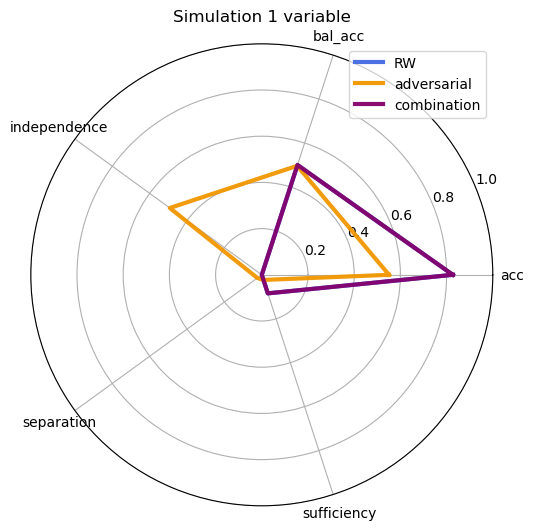

C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  values[method1] = resultsInd.loc[default_labels[method1], cathegories].tolist() + [resultsInd.loc[default_labels[method1], cathegories][0]]
C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  values[method2] = resultsInd.loc[default_labels[method2], cathegories].tolist() + [resultsInd.loc[default_labels[method2], cathegories][0]]
C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:48: FutureWarning: Series.__getitem__ treating ke

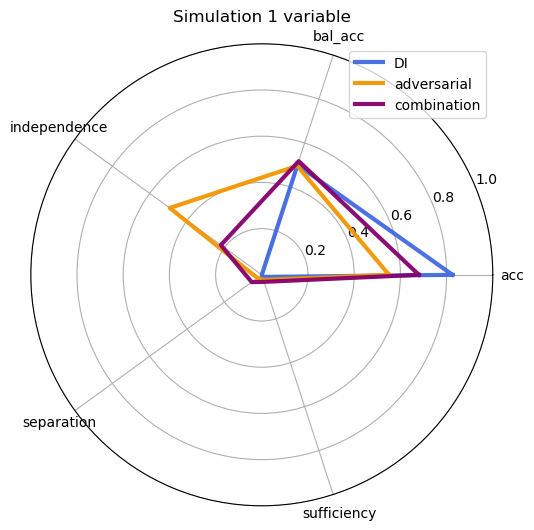

C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  values[method1] = resultsInd.loc[default_labels[method1], cathegories].tolist() + [resultsInd.loc[default_labels[method1], cathegories][0]]
C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  values[method2] = resultsInd.loc[default_labels[method2], cathegories].tolist() + [resultsInd.loc[default_labels[method2], cathegories][0]]
C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:48: FutureWarning: Series.__getitem__ treating ke

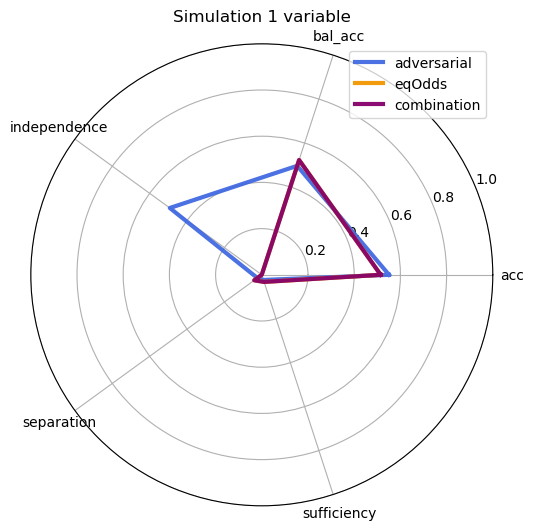

C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  values[method1] = resultsInd.loc[default_labels[method1], cathegories].tolist() + [resultsInd.loc[default_labels[method1], cathegories][0]]
C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  values[method2] = resultsInd.loc[default_labels[method2], cathegories].tolist() + [resultsInd.loc[default_labels[method2], cathegories][0]]
C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:48: FutureWarning: Series.__getitem__ treating ke

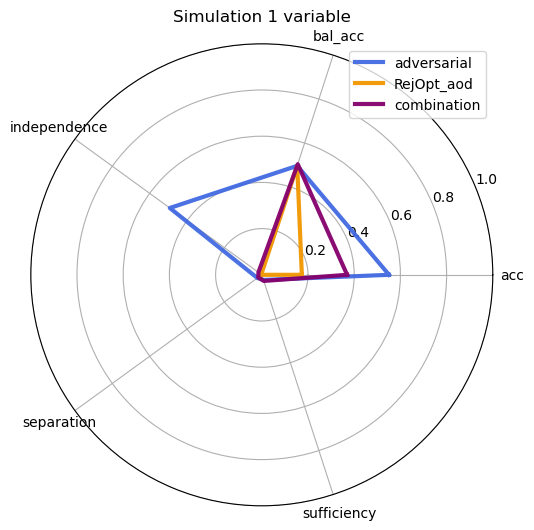

C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  values[method1] = resultsInd.loc[default_labels[method1], cathegories].tolist() + [resultsInd.loc[default_labels[method1], cathegories][0]]
C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  values[method2] = resultsInd.loc[default_labels[method2], cathegories].tolist() + [resultsInd.loc[default_labels[method2], cathegories][0]]
C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:48: FutureWarning: Series.__getitem__ treating ke

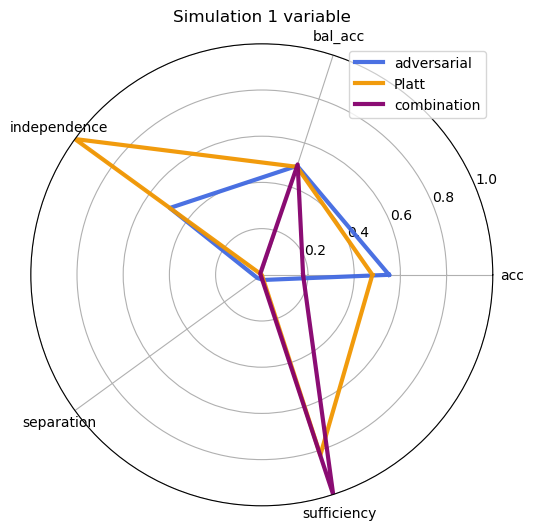

C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  values[method1] = resultsInd.loc[default_labels[method1], cathegories].tolist() + [resultsInd.loc[default_labels[method1], cathegories][0]]
C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  values[method2] = resultsInd.loc[default_labels[method2], cathegories].tolist() + [resultsInd.loc[default_labels[method2], cathegories][0]]
C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:48: FutureWarning: Series.__getitem__ treating ke

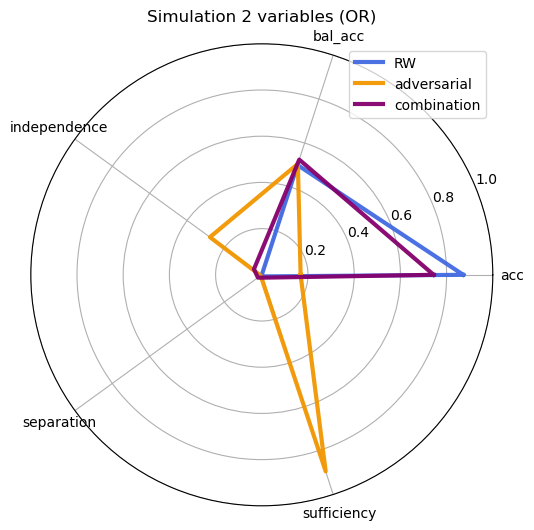

C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  values[method1] = resultsInd.loc[default_labels[method1], cathegories].tolist() + [resultsInd.loc[default_labels[method1], cathegories][0]]
C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  values[method2] = resultsInd.loc[default_labels[method2], cathegories].tolist() + [resultsInd.loc[default_labels[method2], cathegories][0]]
C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:48: FutureWarning: Series.__getitem__ treating ke

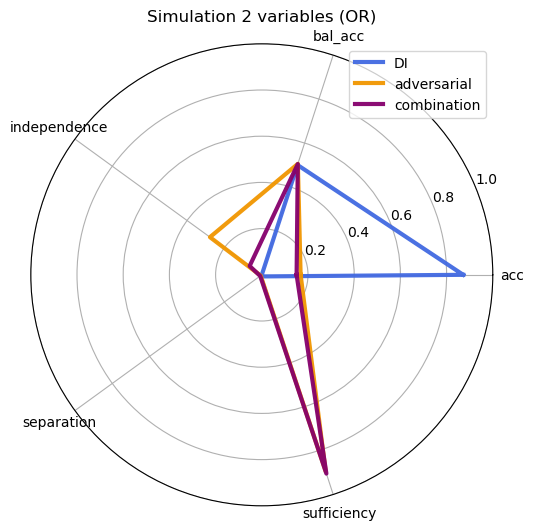

C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  values[method1] = resultsInd.loc[default_labels[method1], cathegories].tolist() + [resultsInd.loc[default_labels[method1], cathegories][0]]
C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  values[method2] = resultsInd.loc[default_labels[method2], cathegories].tolist() + [resultsInd.loc[default_labels[method2], cathegories][0]]
C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:48: FutureWarning: Series.__getitem__ treating ke

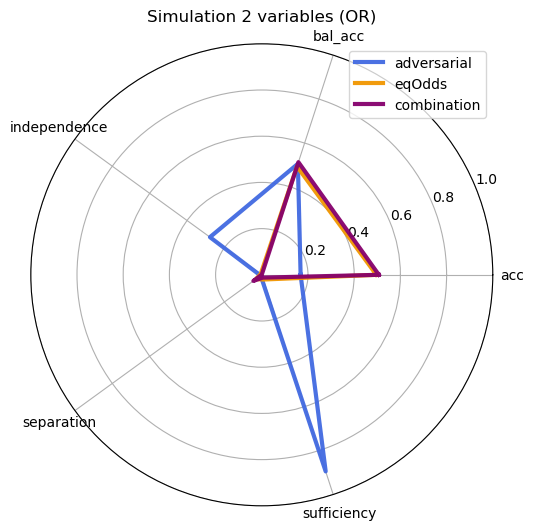

C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  values[method1] = resultsInd.loc[default_labels[method1], cathegories].tolist() + [resultsInd.loc[default_labels[method1], cathegories][0]]
C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  values[method2] = resultsInd.loc[default_labels[method2], cathegories].tolist() + [resultsInd.loc[default_labels[method2], cathegories][0]]
C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:48: FutureWarning: Series.__getitem__ treating ke

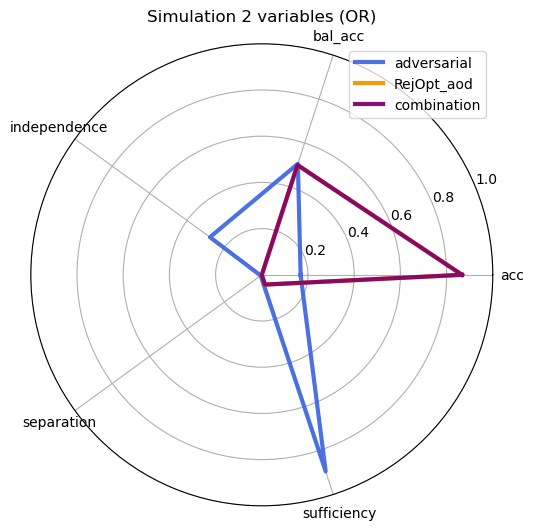

C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  values[method1] = resultsInd.loc[default_labels[method1], cathegories].tolist() + [resultsInd.loc[default_labels[method1], cathegories][0]]
C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  values[method2] = resultsInd.loc[default_labels[method2], cathegories].tolist() + [resultsInd.loc[default_labels[method2], cathegories][0]]
C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:48: FutureWarning: Series.__getitem__ treating ke

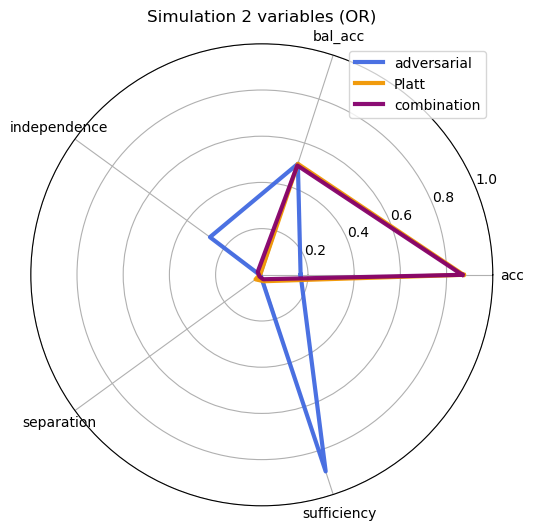

C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  values[method1] = resultsInd.loc[default_labels[method1], cathegories].tolist() + [resultsInd.loc[default_labels[method1], cathegories][0]]
C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  values[method2] = resultsInd.loc[default_labels[method2], cathegories].tolist() + [resultsInd.loc[default_labels[method2], cathegories][0]]
C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:48: FutureWarning: Series.__getitem__ treating ke

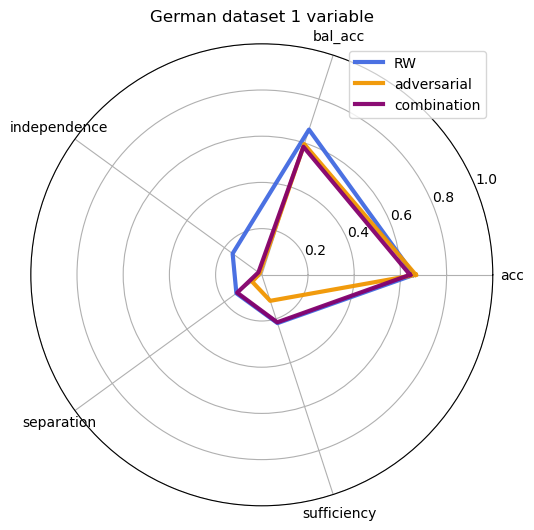

C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  values[method1] = resultsInd.loc[default_labels[method1], cathegories].tolist() + [resultsInd.loc[default_labels[method1], cathegories][0]]
C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  values[method2] = resultsInd.loc[default_labels[method2], cathegories].tolist() + [resultsInd.loc[default_labels[method2], cathegories][0]]
C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:48: FutureWarning: Series.__getitem__ treating ke

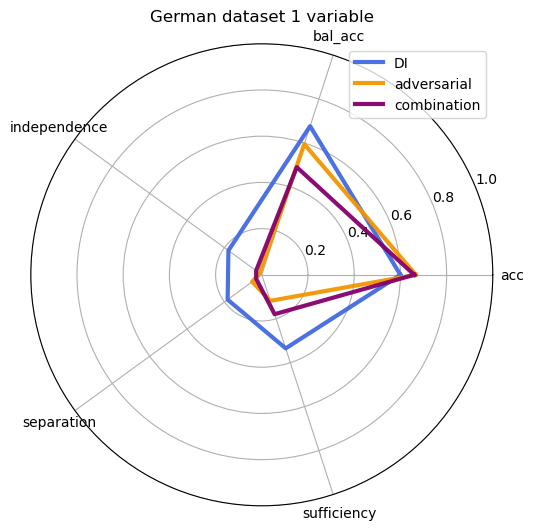

C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  values[method1] = resultsInd.loc[default_labels[method1], cathegories].tolist() + [resultsInd.loc[default_labels[method1], cathegories][0]]
C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  values[method2] = resultsInd.loc[default_labels[method2], cathegories].tolist() + [resultsInd.loc[default_labels[method2], cathegories][0]]
C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:48: FutureWarning: Series.__getitem__ treating ke

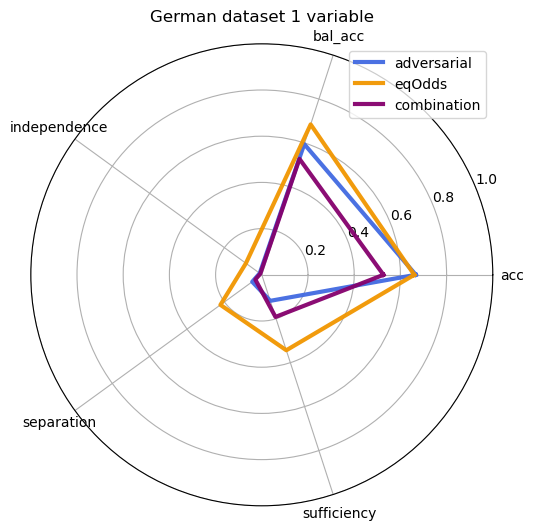

C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  values[method1] = resultsInd.loc[default_labels[method1], cathegories].tolist() + [resultsInd.loc[default_labels[method1], cathegories][0]]
C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  values[method2] = resultsInd.loc[default_labels[method2], cathegories].tolist() + [resultsInd.loc[default_labels[method2], cathegories][0]]
C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:48: FutureWarning: Series.__getitem__ treating ke

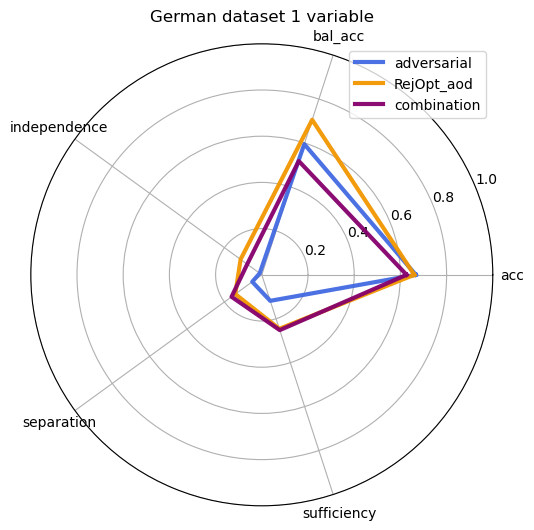

C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  values[method1] = resultsInd.loc[default_labels[method1], cathegories].tolist() + [resultsInd.loc[default_labels[method1], cathegories][0]]
C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  values[method2] = resultsInd.loc[default_labels[method2], cathegories].tolist() + [resultsInd.loc[default_labels[method2], cathegories][0]]
C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:48: FutureWarning: Series.__getitem__ treating ke

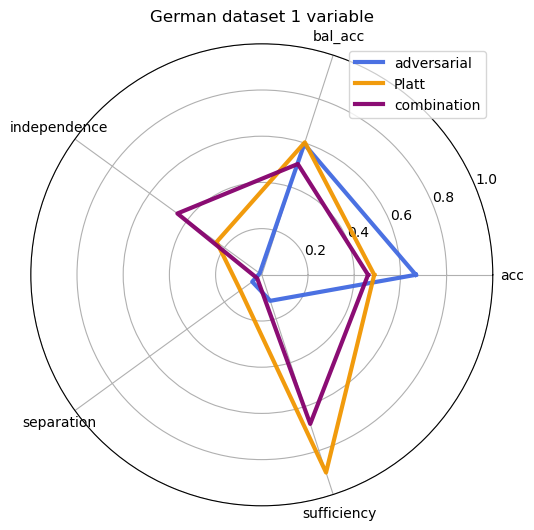

C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  values[method1] = resultsInd.loc[default_labels[method1], cathegories].tolist() + [resultsInd.loc[default_labels[method1], cathegories][0]]
C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  values[method2] = resultsInd.loc[default_labels[method2], cathegories].tolist() + [resultsInd.loc[default_labels[method2], cathegories][0]]
C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:48: FutureWarning: Series.__getitem__ treating ke

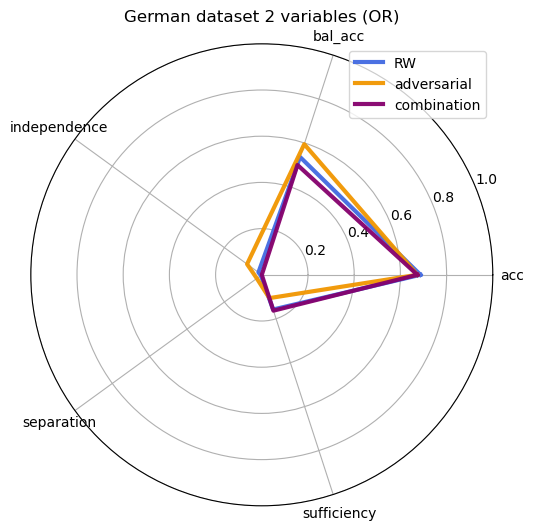

C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  values[method1] = resultsInd.loc[default_labels[method1], cathegories].tolist() + [resultsInd.loc[default_labels[method1], cathegories][0]]
C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  values[method2] = resultsInd.loc[default_labels[method2], cathegories].tolist() + [resultsInd.loc[default_labels[method2], cathegories][0]]
C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:48: FutureWarning: Series.__getitem__ treating ke

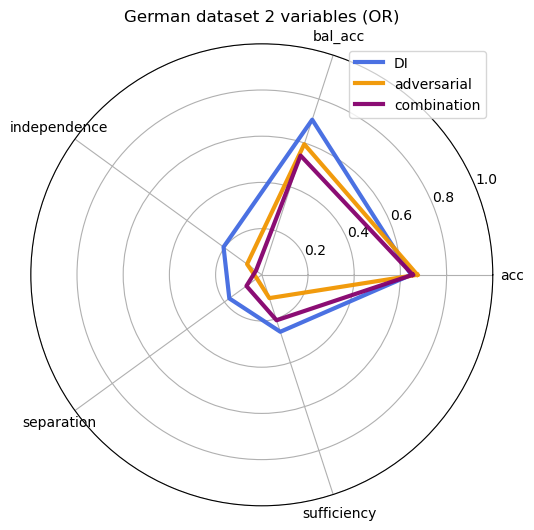

C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  values[method1] = resultsInd.loc[default_labels[method1], cathegories].tolist() + [resultsInd.loc[default_labels[method1], cathegories][0]]
C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  values[method2] = resultsInd.loc[default_labels[method2], cathegories].tolist() + [resultsInd.loc[default_labels[method2], cathegories][0]]
C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:48: FutureWarning: Series.__getitem__ treating ke

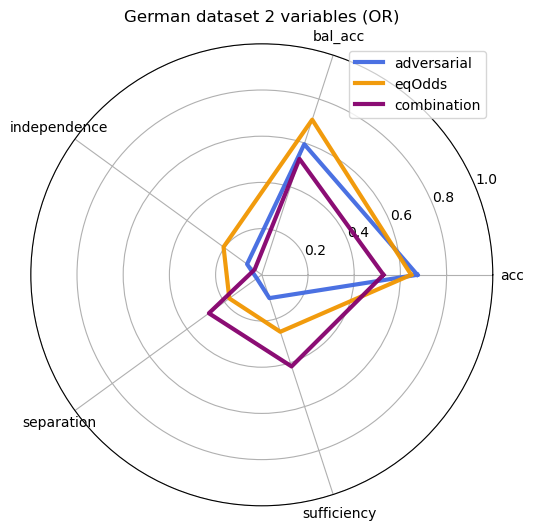

C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  values[method1] = resultsInd.loc[default_labels[method1], cathegories].tolist() + [resultsInd.loc[default_labels[method1], cathegories][0]]
C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  values[method2] = resultsInd.loc[default_labels[method2], cathegories].tolist() + [resultsInd.loc[default_labels[method2], cathegories][0]]
C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:48: FutureWarning: Series.__getitem__ treating ke

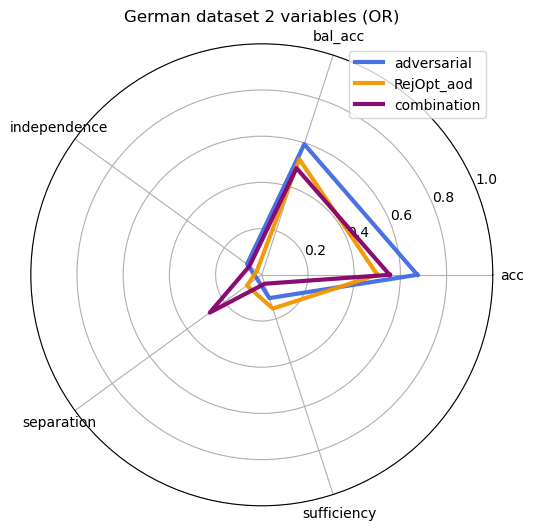

C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  values[method1] = resultsInd.loc[default_labels[method1], cathegories].tolist() + [resultsInd.loc[default_labels[method1], cathegories][0]]
C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  values[method2] = resultsInd.loc[default_labels[method2], cathegories].tolist() + [resultsInd.loc[default_labels[method2], cathegories][0]]
C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:48: FutureWarning: Series.__getitem__ treating ke

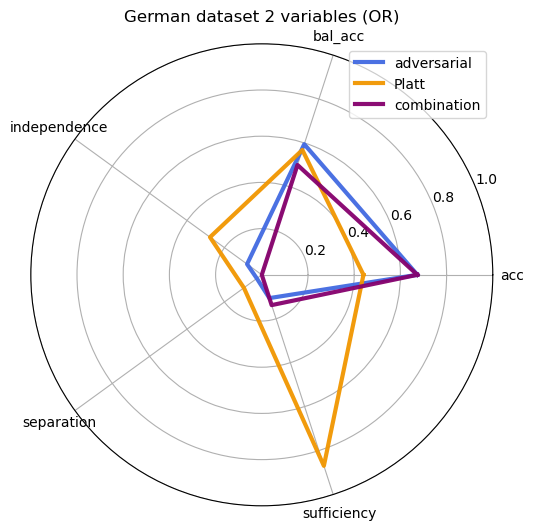

C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  values[method1] = resultsInd.loc[default_labels[method1], cathegories].tolist() + [resultsInd.loc[default_labels[method1], cathegories][0]]
C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  values[method2] = resultsInd.loc[default_labels[method2], cathegories].tolist() + [resultsInd.loc[default_labels[method2], cathegories][0]]
C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:48: FutureWarning: Series.__getitem__ treating ke

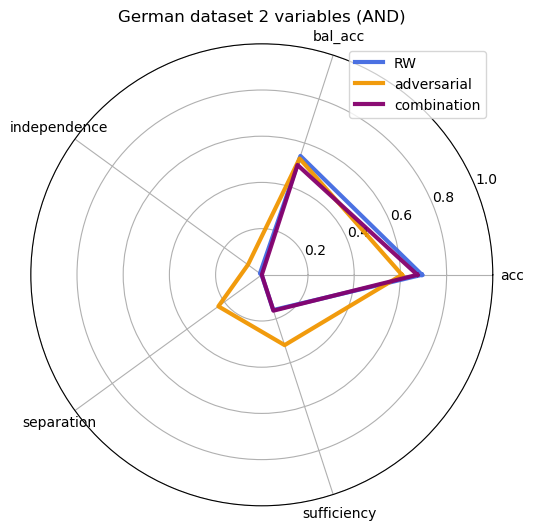

C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  values[method1] = resultsInd.loc[default_labels[method1], cathegories].tolist() + [resultsInd.loc[default_labels[method1], cathegories][0]]
C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  values[method2] = resultsInd.loc[default_labels[method2], cathegories].tolist() + [resultsInd.loc[default_labels[method2], cathegories][0]]
C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:48: FutureWarning: Series.__getitem__ treating ke

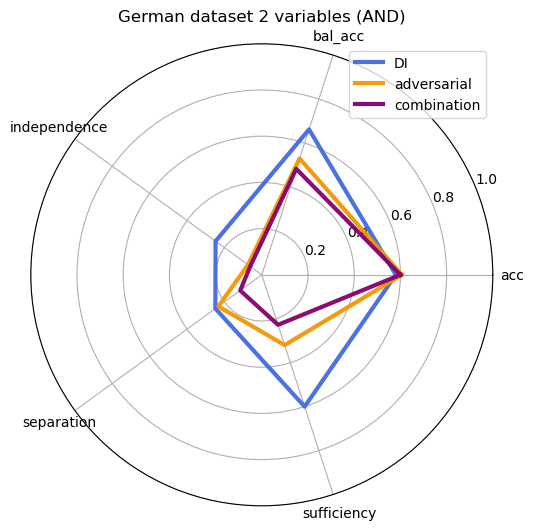

C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  values[method1] = resultsInd.loc[default_labels[method1], cathegories].tolist() + [resultsInd.loc[default_labels[method1], cathegories][0]]
C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  values[method2] = resultsInd.loc[default_labels[method2], cathegories].tolist() + [resultsInd.loc[default_labels[method2], cathegories][0]]
C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:48: FutureWarning: Series.__getitem__ treating ke

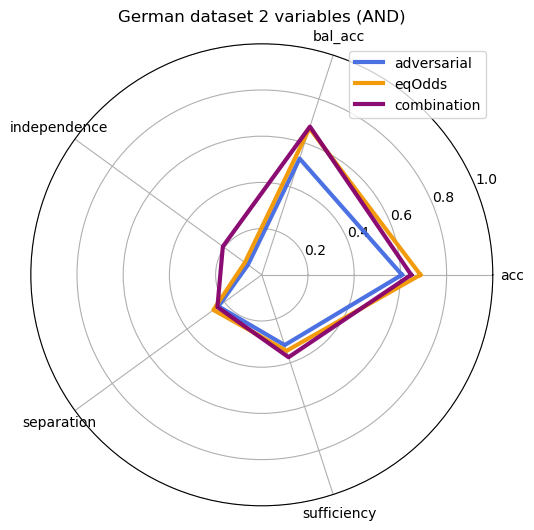

C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  values[method1] = resultsInd.loc[default_labels[method1], cathegories].tolist() + [resultsInd.loc[default_labels[method1], cathegories][0]]
C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  values[method2] = resultsInd.loc[default_labels[method2], cathegories].tolist() + [resultsInd.loc[default_labels[method2], cathegories][0]]
C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:48: FutureWarning: Series.__getitem__ treating ke

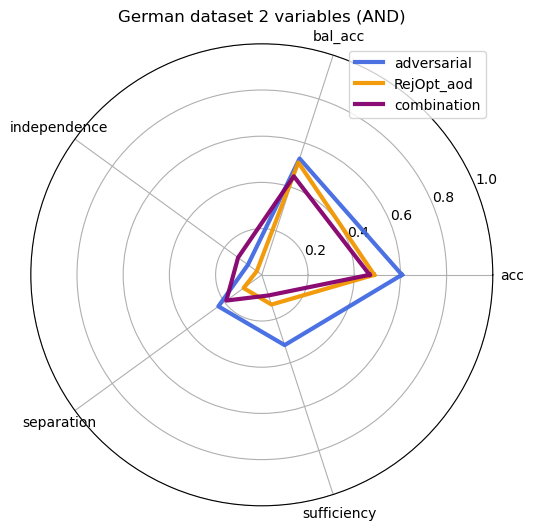

C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  values[method1] = resultsInd.loc[default_labels[method1], cathegories].tolist() + [resultsInd.loc[default_labels[method1], cathegories][0]]
C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  values[method2] = resultsInd.loc[default_labels[method2], cathegories].tolist() + [resultsInd.loc[default_labels[method2], cathegories][0]]
C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:48: FutureWarning: Series.__getitem__ treating ke

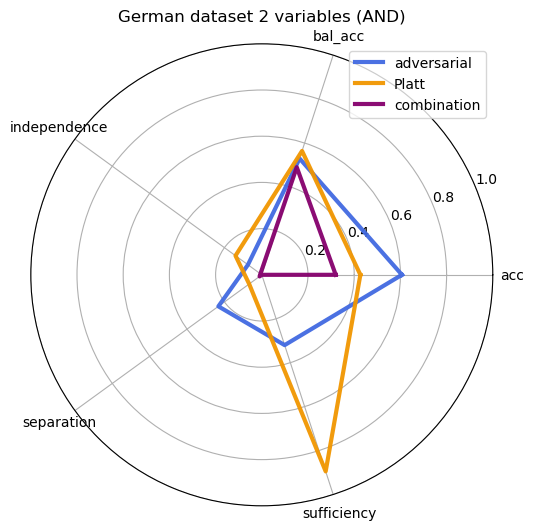

C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  values[method1] = resultsInd.loc[default_labels[method1], cathegories].tolist() + [resultsInd.loc[default_labels[method1], cathegories][0]]
C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  values[method2] = resultsInd.loc[default_labels[method2], cathegories].tolist() + [resultsInd.loc[default_labels[method2], cathegories][0]]
C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:48: FutureWarning: Series.__getitem__ treating ke

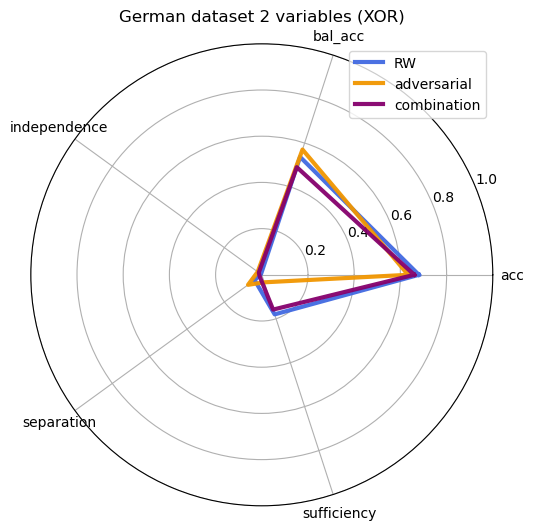

C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  values[method1] = resultsInd.loc[default_labels[method1], cathegories].tolist() + [resultsInd.loc[default_labels[method1], cathegories][0]]
C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  values[method2] = resultsInd.loc[default_labels[method2], cathegories].tolist() + [resultsInd.loc[default_labels[method2], cathegories][0]]
C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:48: FutureWarning: Series.__getitem__ treating ke

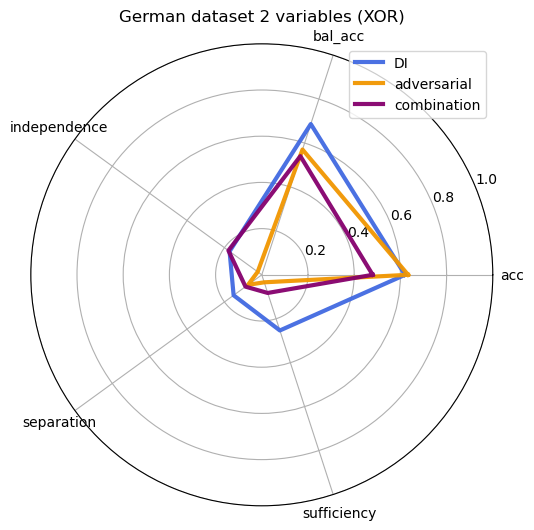

C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  values[method1] = resultsInd.loc[default_labels[method1], cathegories].tolist() + [resultsInd.loc[default_labels[method1], cathegories][0]]
C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  values[method2] = resultsInd.loc[default_labels[method2], cathegories].tolist() + [resultsInd.loc[default_labels[method2], cathegories][0]]
C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:48: FutureWarning: Series.__getitem__ treating ke

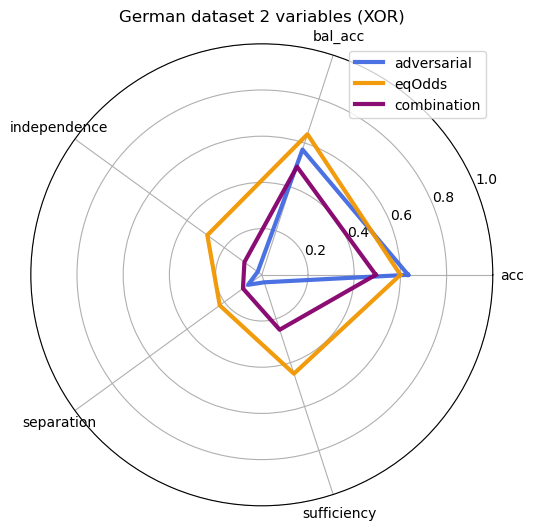

C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  values[method1] = resultsInd.loc[default_labels[method1], cathegories].tolist() + [resultsInd.loc[default_labels[method1], cathegories][0]]
C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  values[method2] = resultsInd.loc[default_labels[method2], cathegories].tolist() + [resultsInd.loc[default_labels[method2], cathegories][0]]
C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:48: FutureWarning: Series.__getitem__ treating ke

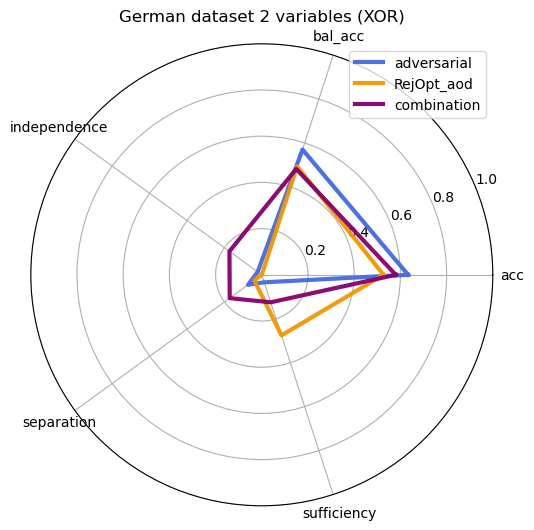

C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:46: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  values[method1] = resultsInd.loc[default_labels[method1], cathegories].tolist() + [resultsInd.loc[default_labels[method1], cathegories][0]]
C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  values[method2] = resultsInd.loc[default_labels[method2], cathegories].tolist() + [resultsInd.loc[default_labels[method2], cathegories][0]]
C:\Users\Arturo\AppData\Local\Temp\ipykernel_25784\3143979306.py:48: FutureWarning: Series.__getitem__ treating ke

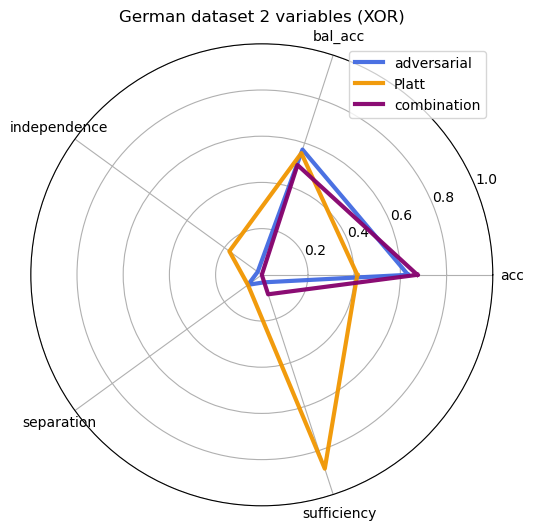

In [37]:
preproc = ['RW', 'DI']
inproc = ['pir', 'adversarial', 'metafair']
postproc = ['eqOdds', 'RejOpt_aod', 'Platt']

for method in preproc:
    fig, ax = plot_radar(resultsDict['Simulation']['Simulation1V_ind_1'], resultsDict['Simulation']['Simulation1V_com_1'], method, 'adversarial')
    ax.set_title('Simulation 1 variable')
    plt.show()
    fig.savefig('results/Figures/performance_radar/Simulation1V_' + method + '+adversarial.png')
    

for method in postproc:
    fig, ax = plot_radar(resultsDict['Simulation']['Simulation1V_ind_1'], resultsDict['Simulation']['Simulation1V_com_1'], 'adversarial', method)
    ax.set_title('Simulation 1 variable')
    plt.show()
    fig.savefig('results/Figures/performance_radar/Simulation1V_adversarial+' + method + '.png')

for method in preproc:
    fig, ax = plot_radar(resultsDict['Simulation']['Simulation2V_OR_ind_1'], resultsDict['Simulation']['Simulation2V_OR_com_1'], method, 'adversarial')
    ax.set_title('Simulation 2 variables (OR)')
    plt.show()
    fig.savefig('results/Figures/performance_radar/Simulation2V_OR_' + method + '+adversarial.png')

for method in postproc:
    fig, ax = plot_radar(resultsDict['Simulation']['Simulation2V_OR_ind_1'], resultsDict['Simulation']['Simulation2V_OR_com_1'], 'adversarial', method)
    ax.set_title('Simulation 2 variables (OR)')
    plt.show()
    fig.savefig('results/Figures/performance_radar/Simulation2V_OR_adversarial+' + method + '.png')


for method in preproc:
    fig, ax = plot_radar(resultsDict['German']['German1V_ind_1'], resultsDict['German']['German1V_com_1'], method, 'adversarial')
    ax.set_title('German dataset 1 variable')
    plt.show()
    fig.savefig('results/Figures/performance_radar/German1V_' + method + '+adversarial.png')
    

for method in postproc:
    fig, ax = plot_radar(resultsDict['German']['German1V_ind_1'], resultsDict['German']['German1V_com_1'], 'adversarial', method)
    ax.set_title('German dataset 1 variable')
    plt.show()
    fig.savefig('results/Figures/performance_radar/German1V_adversarial+' + method + '.png')

for method in preproc:
    fig, ax = plot_radar(resultsDict['German']['German2V_OR_ind_1'], resultsDict['German']['German2V_OR_com_1'], method, 'adversarial')
    ax.set_title('German dataset 2 variables (OR)')
    plt.show()
    fig.savefig('results/Figures/performance_radar/German2V_OR_' + method + '+adversarial.png')

for method in postproc:
    fig, ax = plot_radar(resultsDict['German']['German2V_OR_ind_1'], resultsDict['German']['German2V_OR_com_1'], 'adversarial', method)
    ax.set_title('German dataset 2 variables (OR)')
    plt.show()
    fig.savefig('results/Figures/performance_radar/German2V_OR_adversarial+' + method + '.png')

for method in preproc:
    fig, ax = plot_radar(resultsDict['German']['German2V_AND_ind_1'], resultsDict['German']['German2V_AND_com_1'], method, 'adversarial')
    ax.set_title('German dataset 2 variables (AND)')
    plt.show()
    fig.savefig('results/Figures/performance_radar/German2V_AND_' + method + '+adversarial.png')

for method in postproc:
    fig, ax = plot_radar(resultsDict['German']['German2V_AND_ind_1'], resultsDict['German']['German2V_AND_com_1'], 'adversarial', method)
    ax.set_title('German dataset 2 variables (AND)')
    plt.show()
    fig.savefig('results/Figures/performance_radar/German2V_AND_adversarial+' + method + '.png')

for method in preproc:
    fig, ax = plot_radar(resultsDict['German']['German2V_XOR_ind_1'], resultsDict['German']['German2V_XOR_com_1'], method, 'adversarial')
    ax.set_title('German dataset 2 variables (XOR)')
    plt.show()
    fig.savefig('results/Figures/performance_radar/German2V_XOR_' + method + '+adversarial.png')

for method in postproc:
    fig, ax = plot_radar(resultsDict['German']['German2V_XOR_ind_1'], resultsDict['German']['German2V_XOR_com_1'], 'adversarial', method)
    ax.set_title('German dataset 2 variables (XOR)')
    plt.show()
    fig.savefig('results/Figures/performance_radar/German2V_XOR_adversarial+' + method + '.png')

# Graph plot

We now show the code used for graph visualizations

In [38]:
def graph_visualization(resultsInd: pd.DataFrame, resultsCom: pd.DataFrame, metric: str, title: str = "", name_end: str = "") -> None:
    """
    Graph plot that shows a performance metric for all methods and combinations
    ======================================================================================================
    Inputs:
        resultsInd (pd.DataFrame): Data frame that stores the results of the individual methods.
        resultsCom (pd.DataFrame): Data frame that stores the results of the MP processors.
        metric (str): Name of the metric that will we plotted.
        title (str): Title of the plot.
        name_end (str): Name of the file in which the plot will be saved.

    Outputs:
        None
    """

    # Load the results and save the ones relevant to the metric we are interested in
    matrices = combination_matrix(resultsInd, resultsCom)
    matrix_metric = matrices[metric]

    # Create the figure
    plt.figure(figsize=(8, 6))
    
    # Create graph
    G = nx.Graph()

    # Add nodes and relationships
    proc = preproc + inproc + postproc
    combinations = [(node1, node2) for node1 in preproc for node2 in inproc]
    combinations += [(node1, node2) for node1 in preproc for node2 in postproc]
    combinations += [(node1, node2) for node1 in inproc for node2 in postproc]
    weights = [matrix_metric.loc[node1, node2] for (node1, node2) in combinations] 
    individual_performance = {node1: matrix_metric.loc[node1, node1] for node1 in proc}

    G.add_nodes_from(proc)
    for comb, weight in zip(combinations, weights):
        G.add_edge(comb[0], comb[1], weight=weight)

    # Node colors according to individual performance
    node_colors = [individual_performance[node] for node in G.nodes()]
    if metric == 'acc':
        node_color_map = plt.cm.Blues
    else:
        node_color_map = plt.cm.Blues_r 

    # Edge colors according to combined performance
    edge_colors = [G[u][v]['weight'] for u, v in G.edges()]
    if metric == 'acc':
        edge_color_map = plt.cm.Blues
    else:
        edge_color_map = plt.cm.Blues_r 

    # Graph layout
    pos = nx.spring_layout(G)

    # Create fig
    fig, ax = plt.subplots(figsize=(10, 7))  

    # Draw nodes
    nx.draw_networkx_nodes(G, pos, node_color=node_colors, cmap=node_color_map, node_size=2000)
    nx.draw_networkx_labels(G, pos, font_size=12, font_color='black')

    # Draw edges
    nx.draw_networkx_edges(G, pos, edge_color=edge_colors, edge_cmap=edge_color_map, width=2)

    # Edge labels
    edge_labels = nx.get_edge_attributes(G, 'weight')
    edge_labels = {k: f"{v:.2f}" for k, v in edge_labels.items()}  # Redondear a 2 decimales
    nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_size=10)

    # Colorbar
    sm_nodes = plt.cm.ScalarMappable(cmap=node_color_map, norm=plt.Normalize(vmin=0, vmax=1))
    sm_nodes.set_array([])
    cbar_nodes = plt.colorbar(sm_nodes, ax = ax, shrink=0.7, aspect=10, pad=0.02)
    cbar_nodes.set_label(metric, rotation=270, labelpad=20)

    # Show fig and save it
    plt.title(title)
    plt.show()
    fig.savefig('results/Figures/performance_graph/' + name_end + '.png')

We can now produce the graph plots with the following code:

<Figure size 800x600 with 0 Axes>

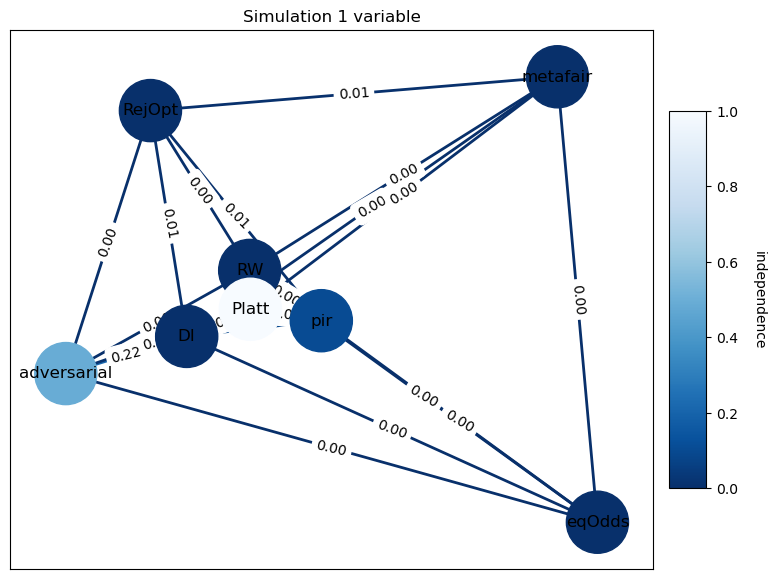

<Figure size 800x600 with 0 Axes>

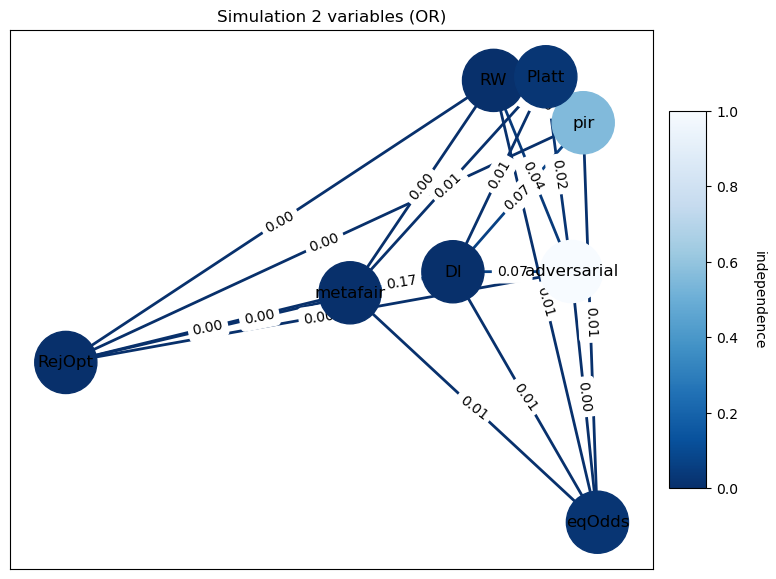

<Figure size 800x600 with 0 Axes>

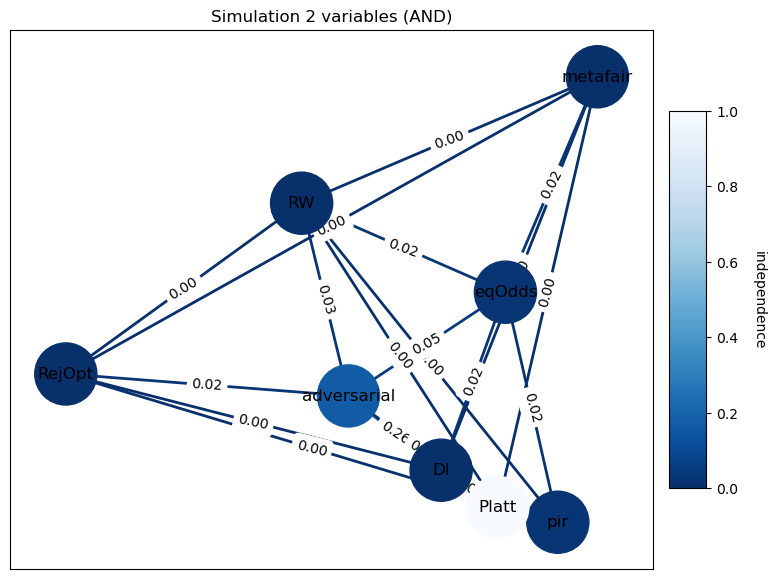

<Figure size 800x600 with 0 Axes>

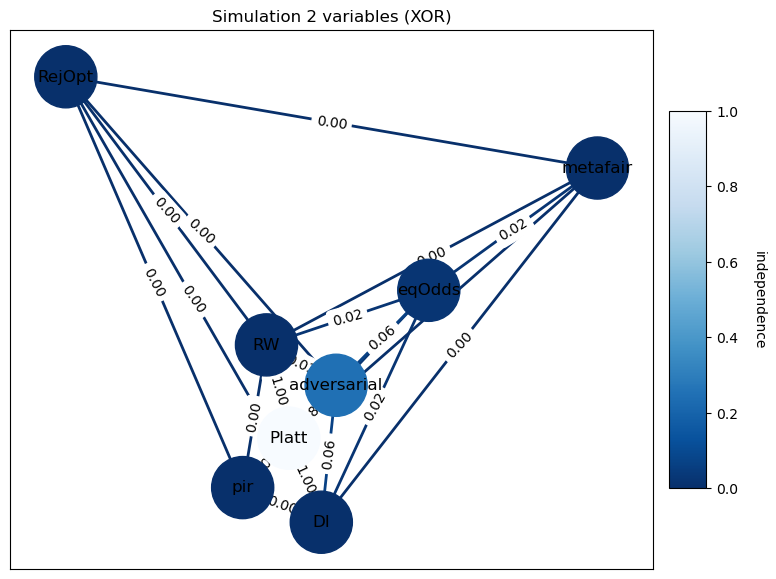

<Figure size 800x600 with 0 Axes>

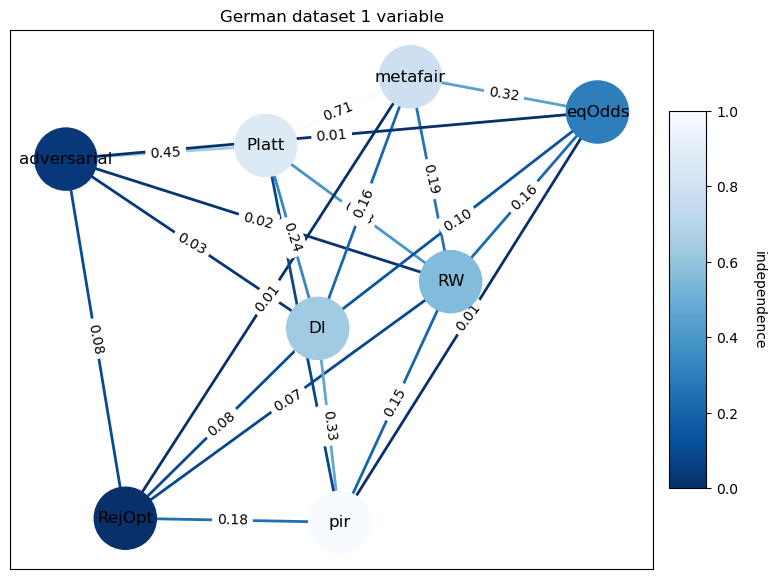

<Figure size 800x600 with 0 Axes>

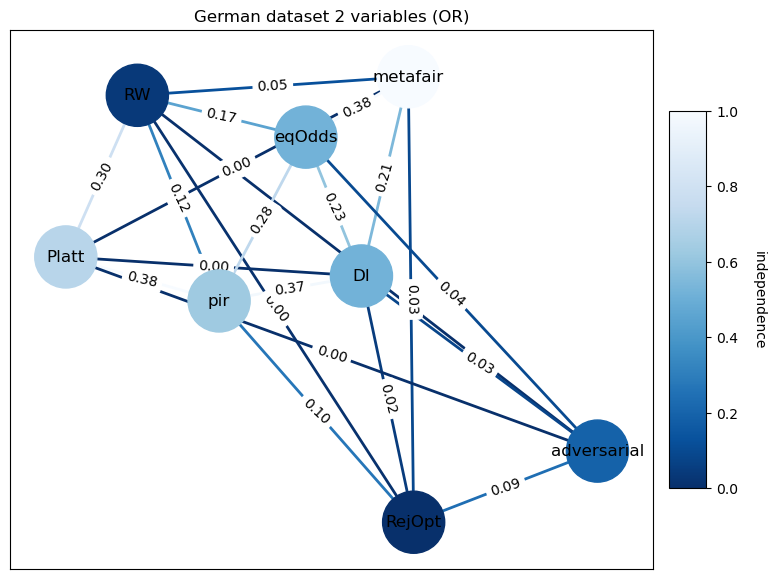

<Figure size 800x600 with 0 Axes>

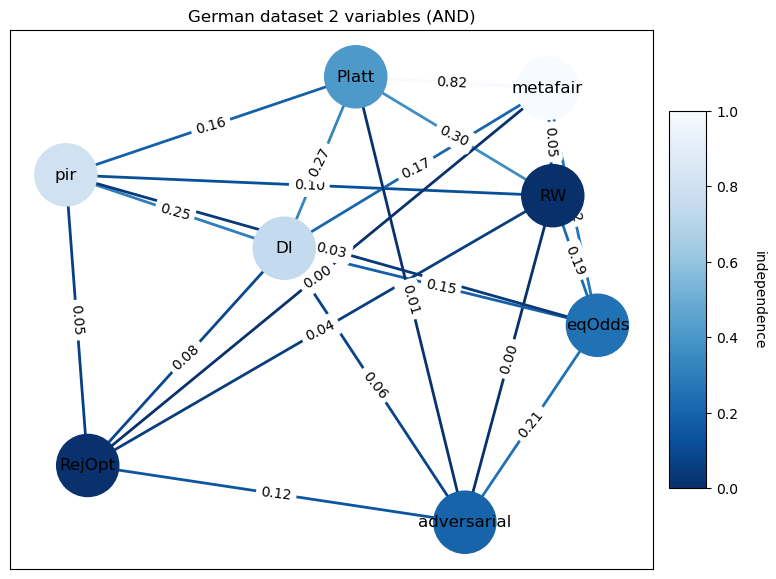

<Figure size 800x600 with 0 Axes>

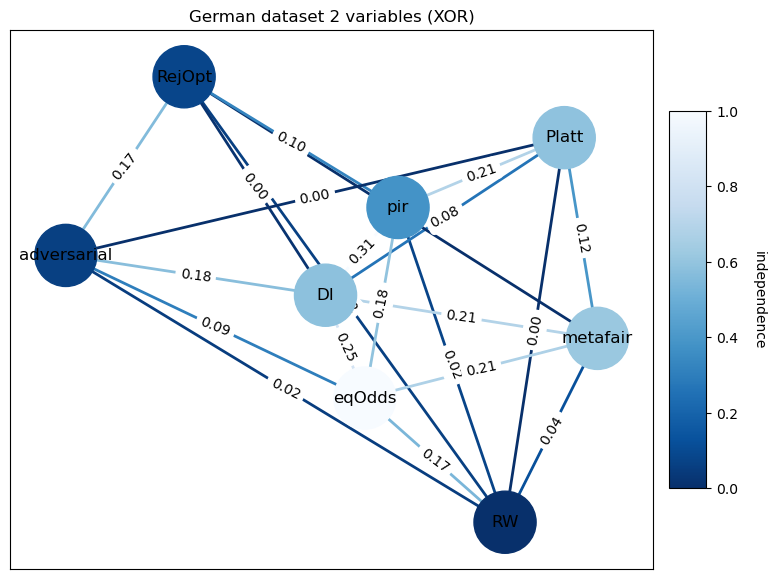

<Figure size 800x600 with 0 Axes>

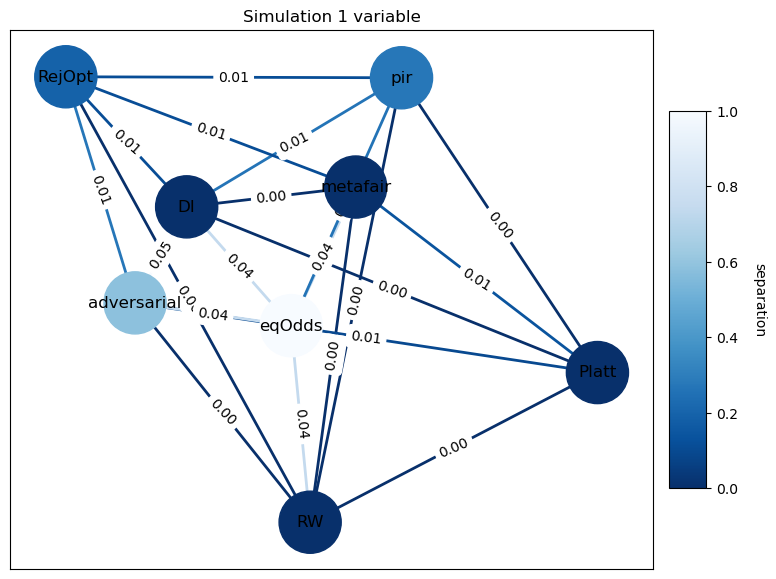

<Figure size 800x600 with 0 Axes>

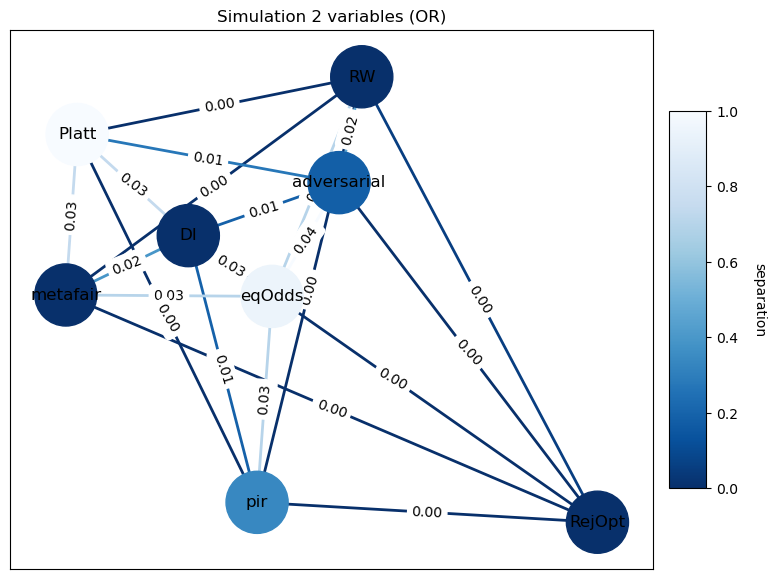

<Figure size 800x600 with 0 Axes>

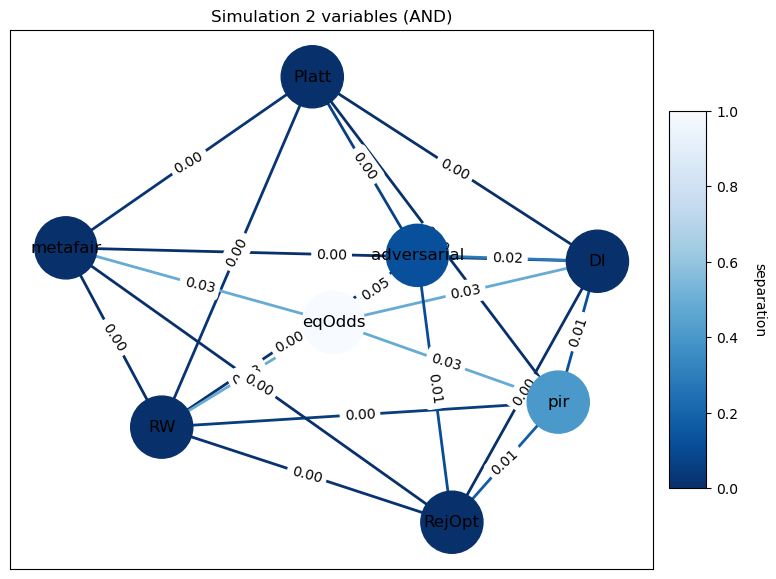

<Figure size 800x600 with 0 Axes>

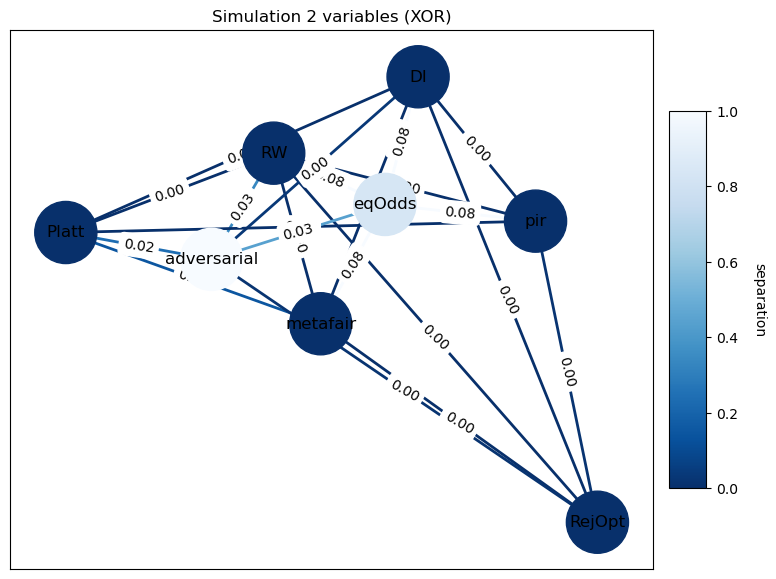

<Figure size 800x600 with 0 Axes>

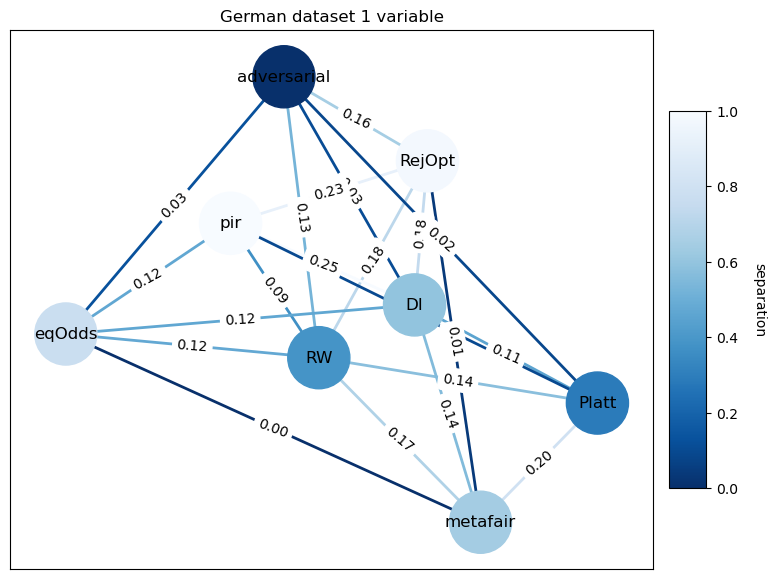

<Figure size 800x600 with 0 Axes>

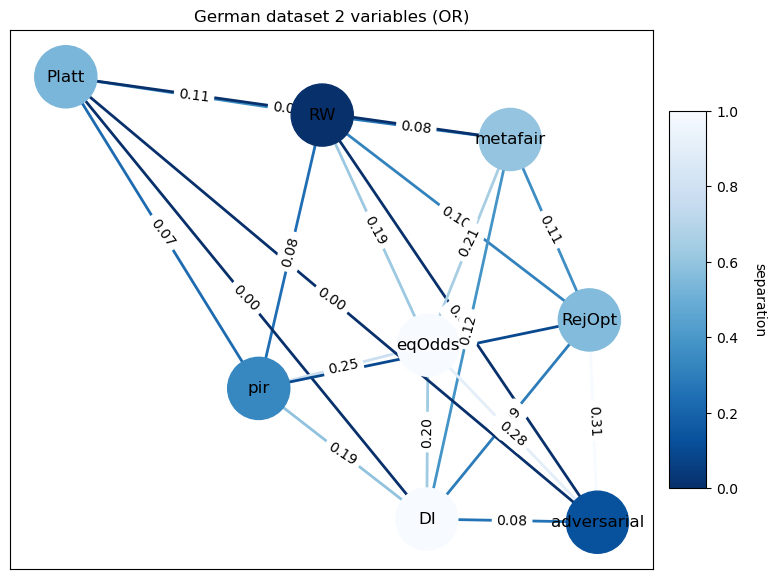

<Figure size 800x600 with 0 Axes>

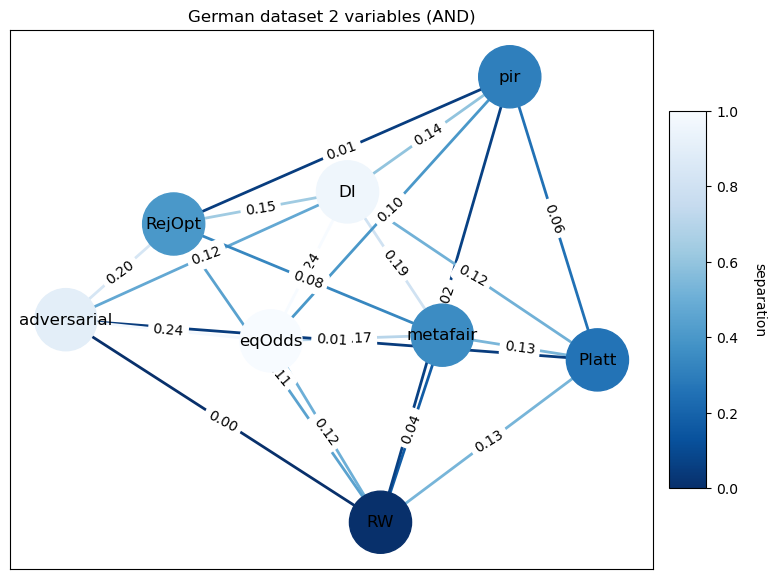

<Figure size 800x600 with 0 Axes>

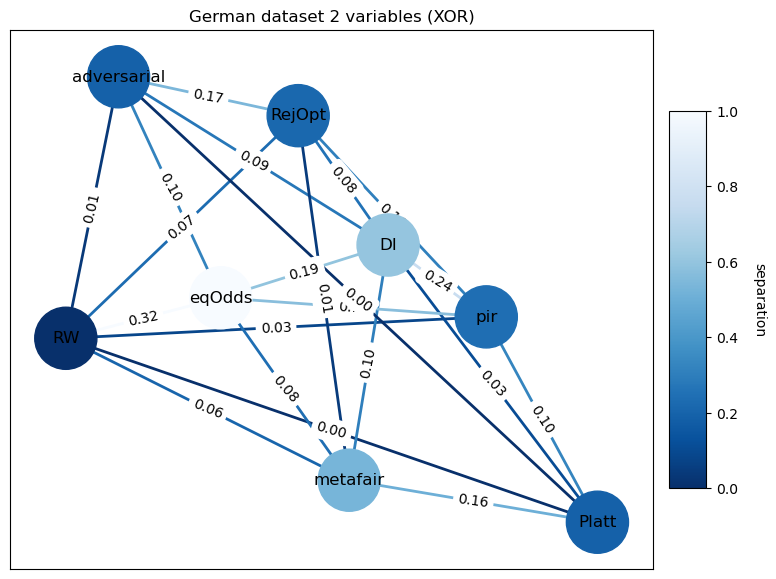

<Figure size 800x600 with 0 Axes>

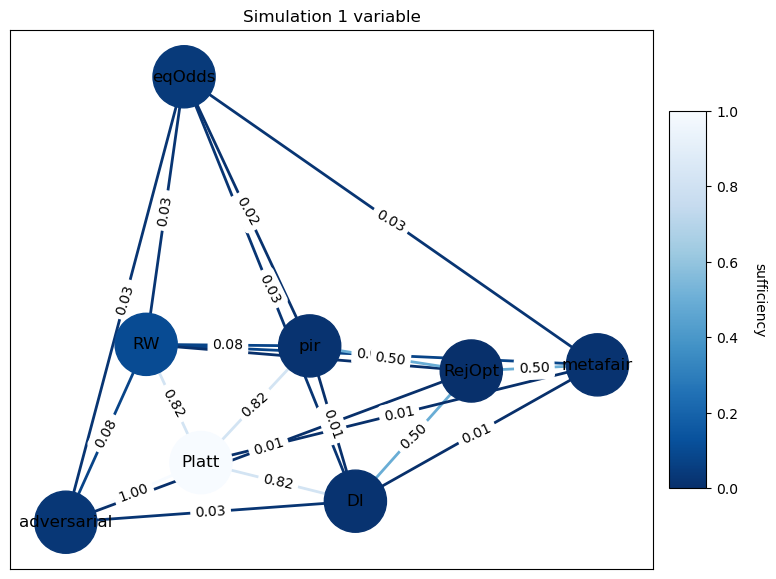

<Figure size 800x600 with 0 Axes>

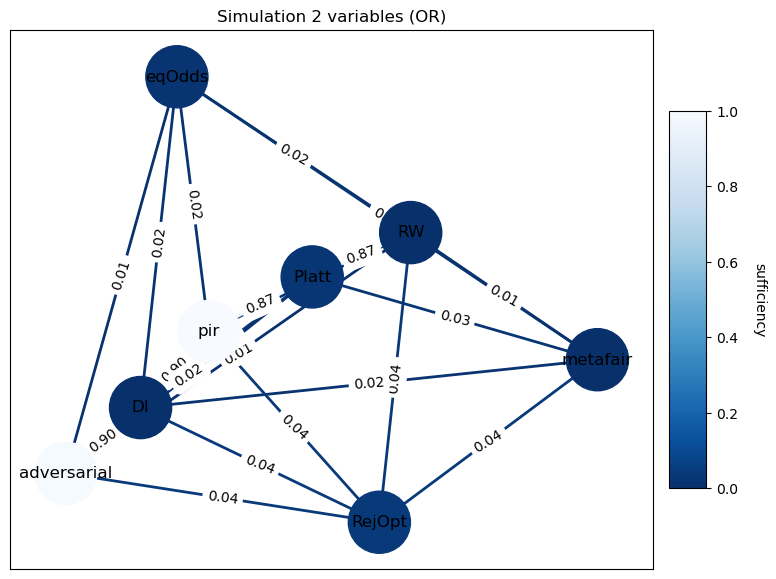

<Figure size 800x600 with 0 Axes>

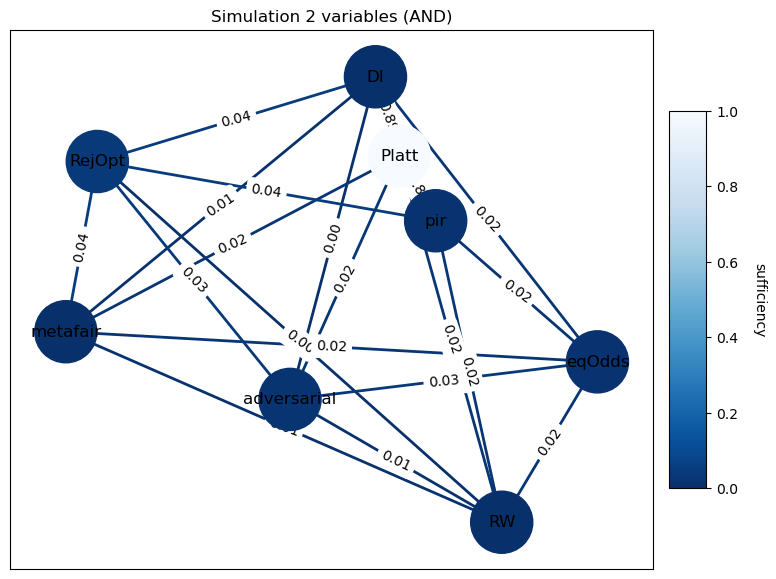

<Figure size 800x600 with 0 Axes>

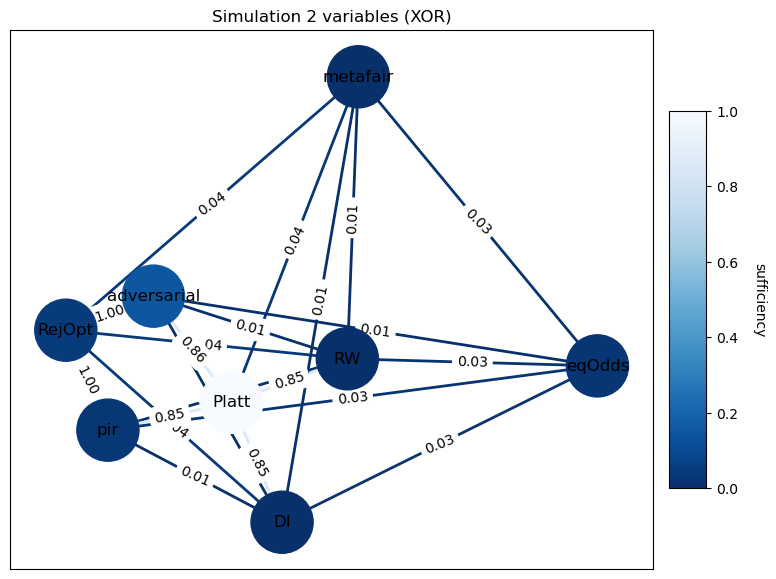

<Figure size 800x600 with 0 Axes>

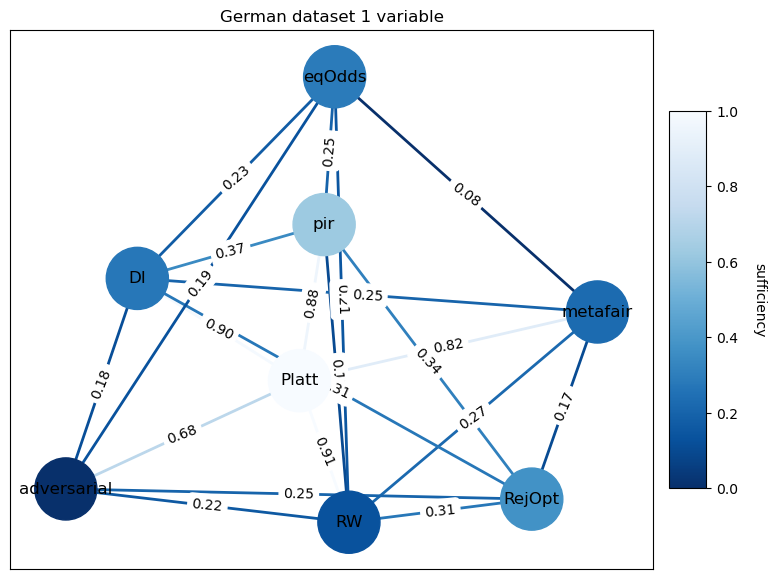

<Figure size 800x600 with 0 Axes>

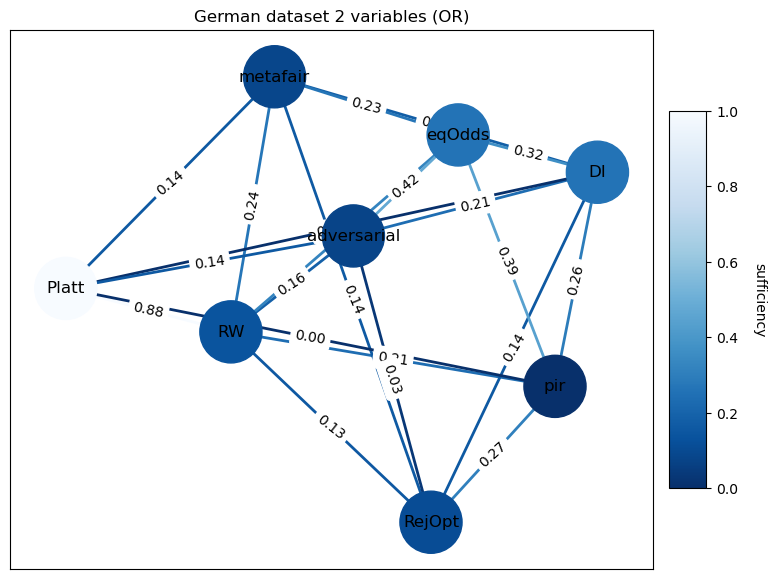

<Figure size 800x600 with 0 Axes>

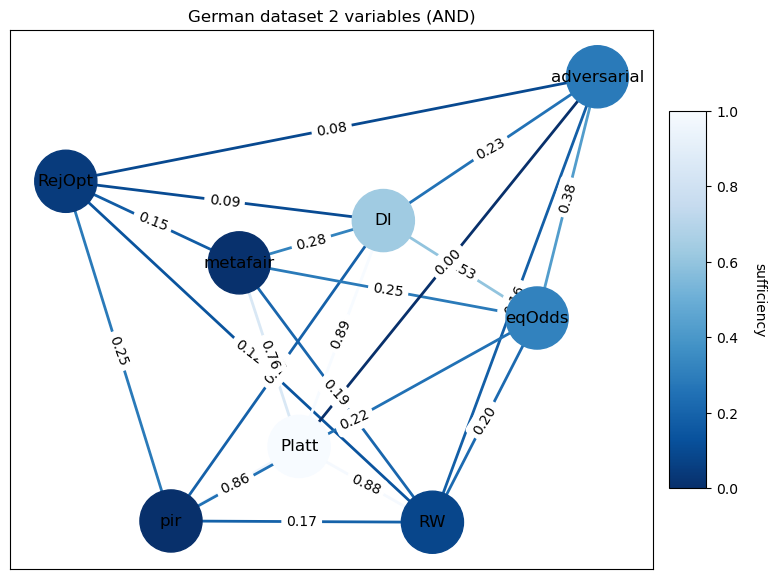

<Figure size 800x600 with 0 Axes>

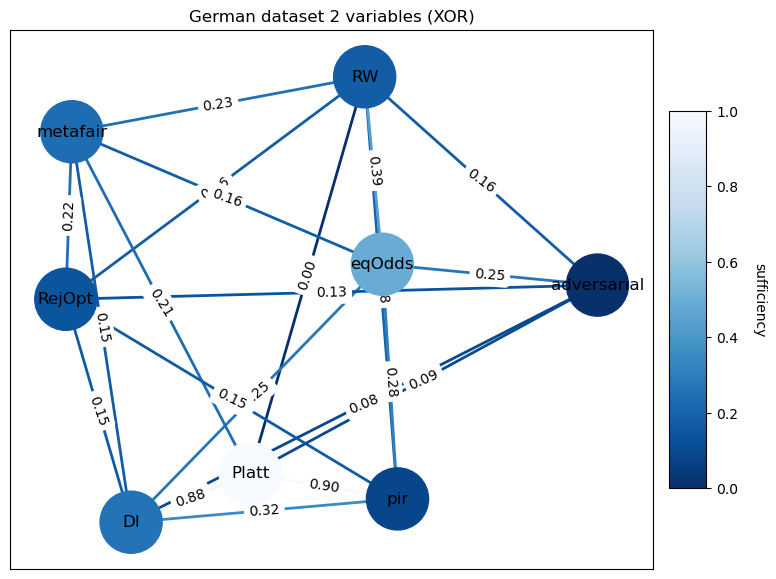

<Figure size 800x600 with 0 Axes>

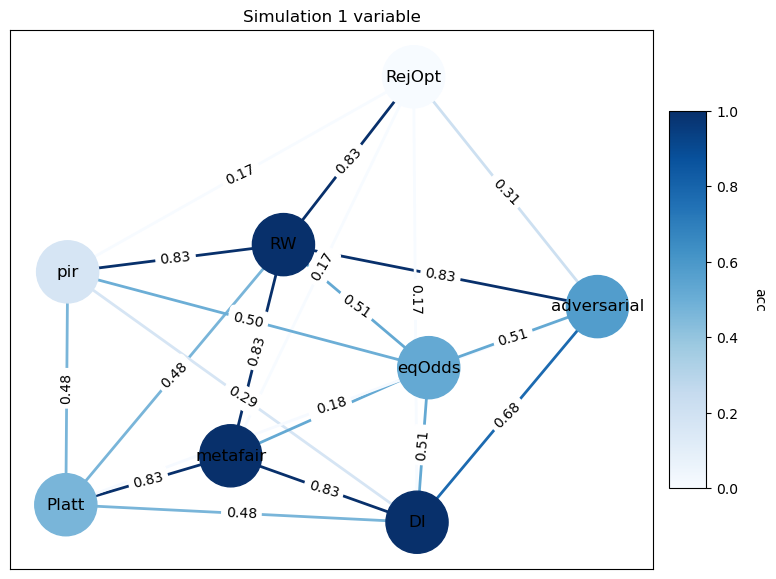

<Figure size 800x600 with 0 Axes>

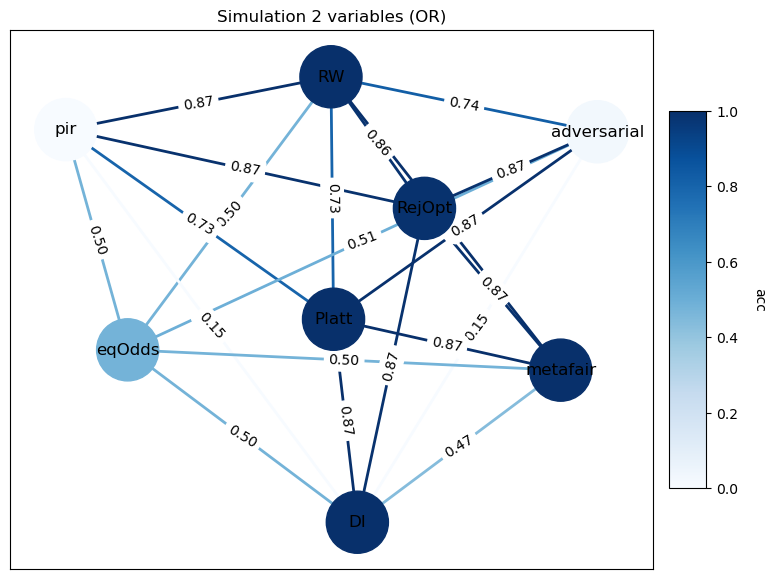

<Figure size 800x600 with 0 Axes>

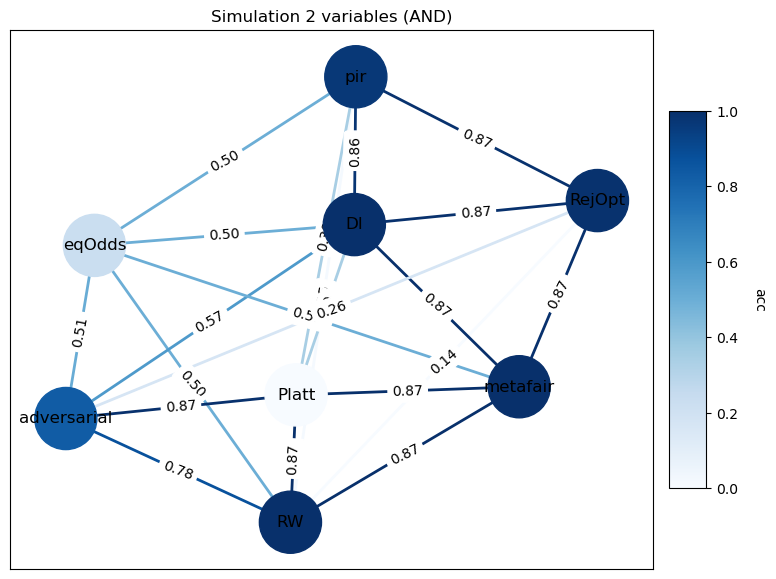

<Figure size 800x600 with 0 Axes>

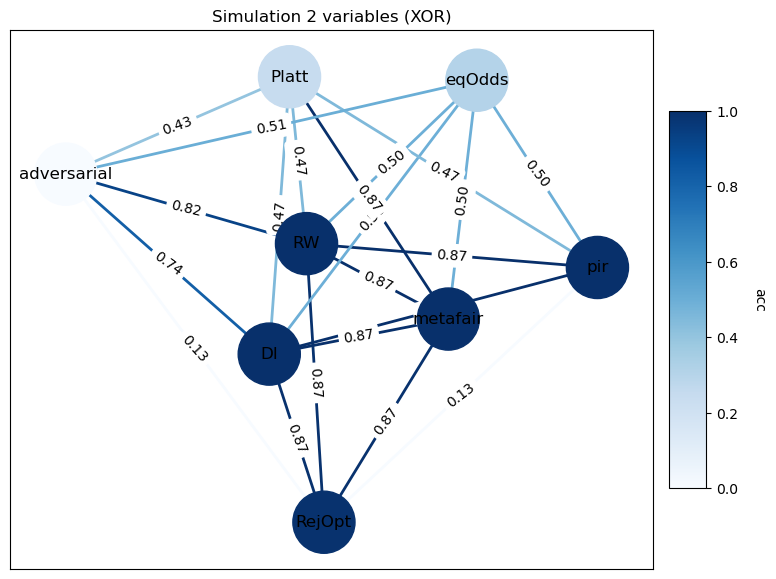

<Figure size 800x600 with 0 Axes>

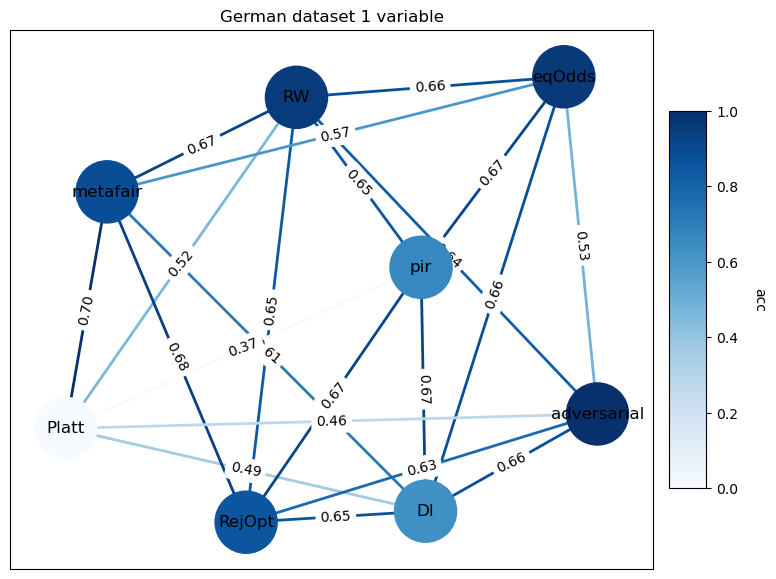

<Figure size 800x600 with 0 Axes>

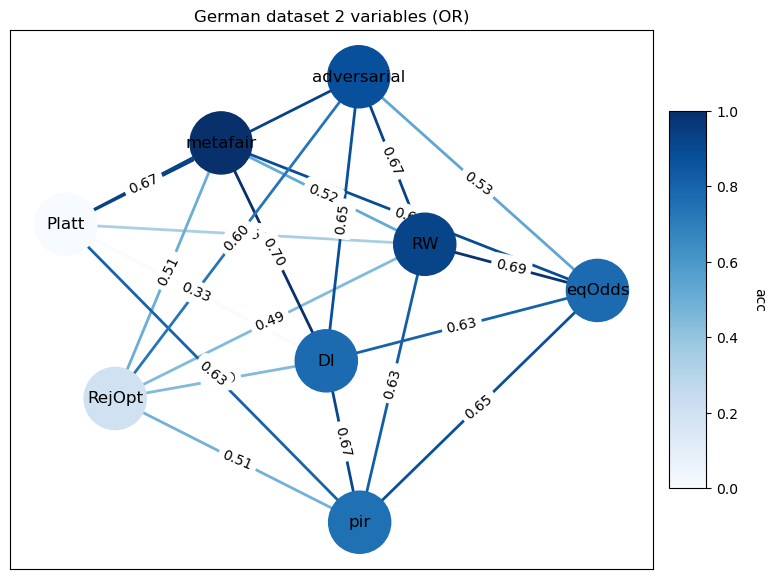

<Figure size 800x600 with 0 Axes>

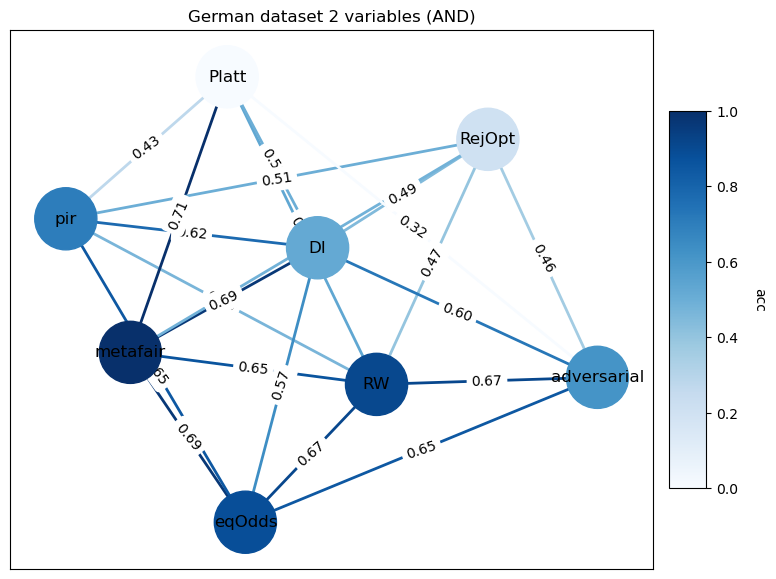

<Figure size 800x600 with 0 Axes>

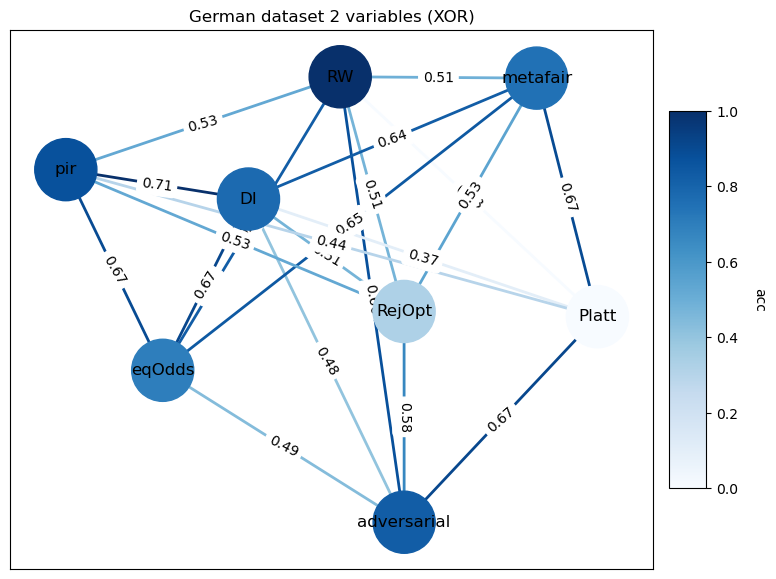

<Figure size 800x600 with 0 Axes>

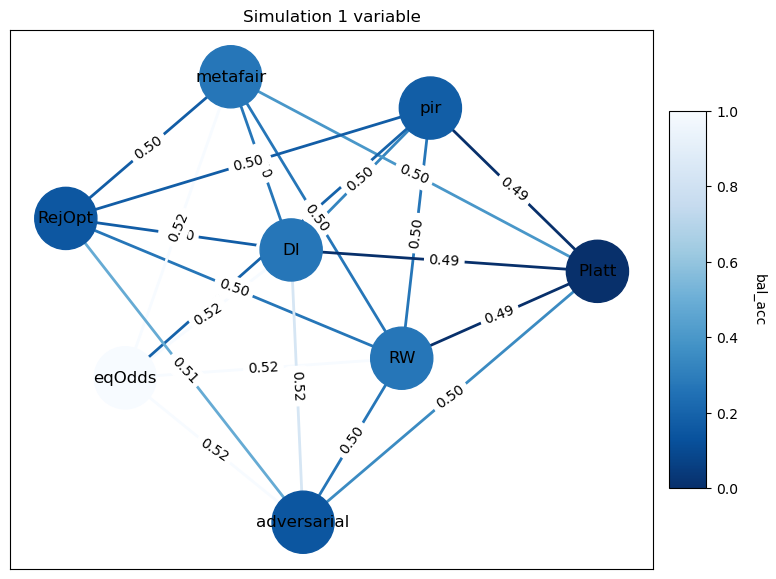

<Figure size 800x600 with 0 Axes>

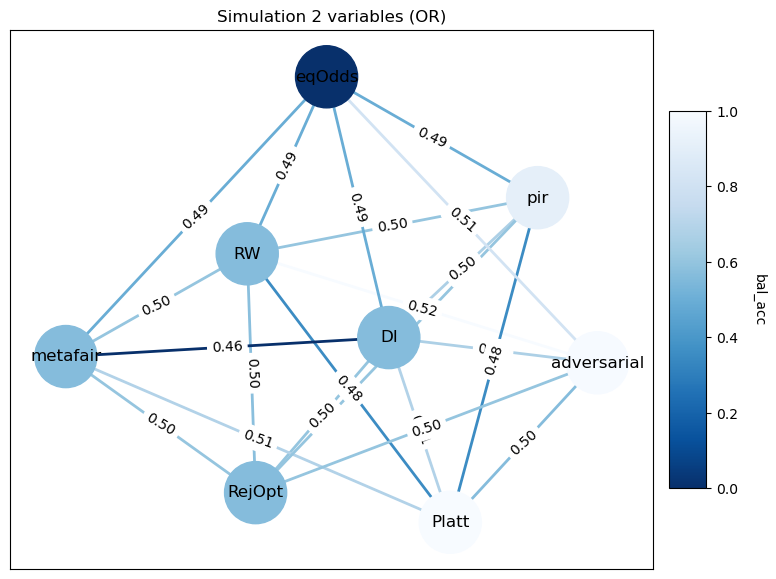

<Figure size 800x600 with 0 Axes>

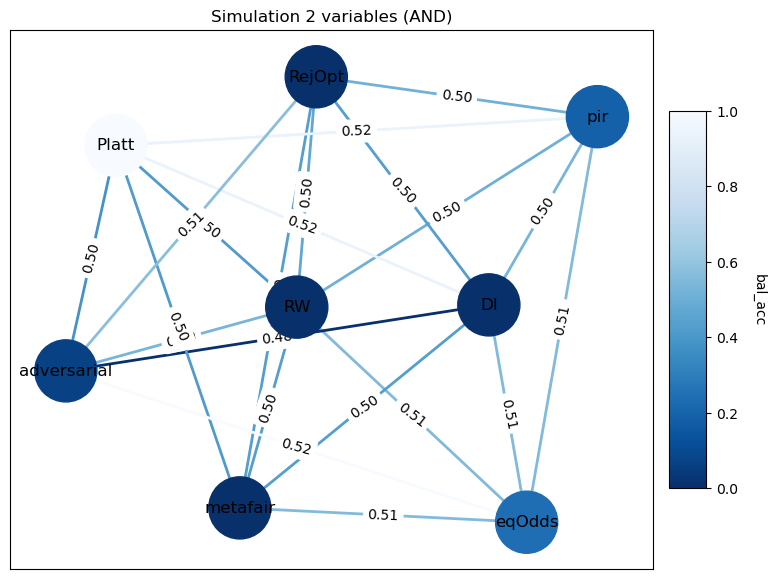

<Figure size 800x600 with 0 Axes>

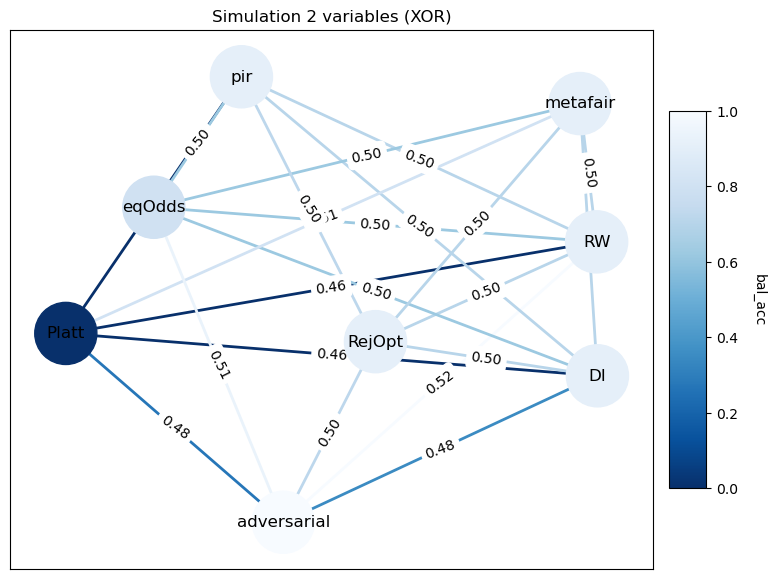

<Figure size 800x600 with 0 Axes>

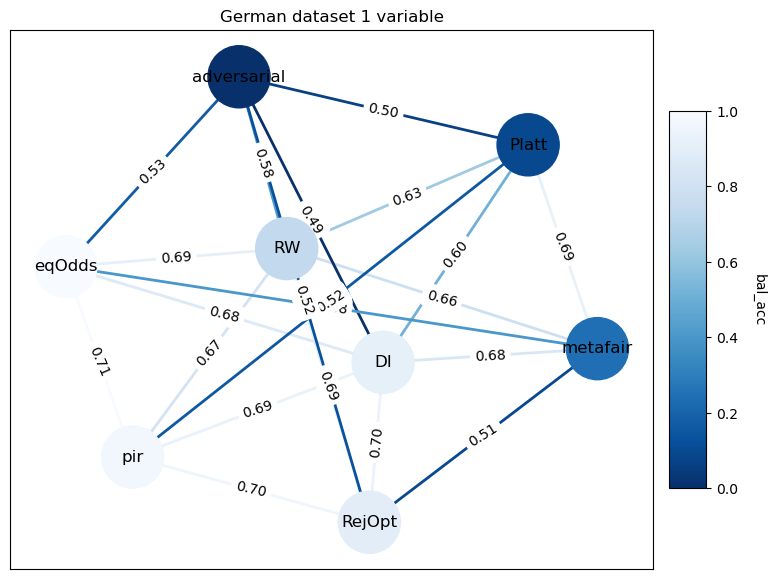

<Figure size 800x600 with 0 Axes>

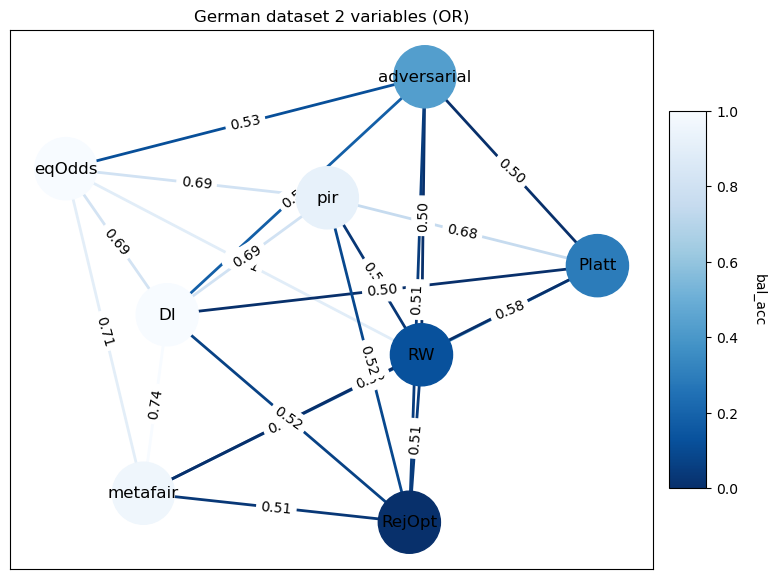

<Figure size 800x600 with 0 Axes>

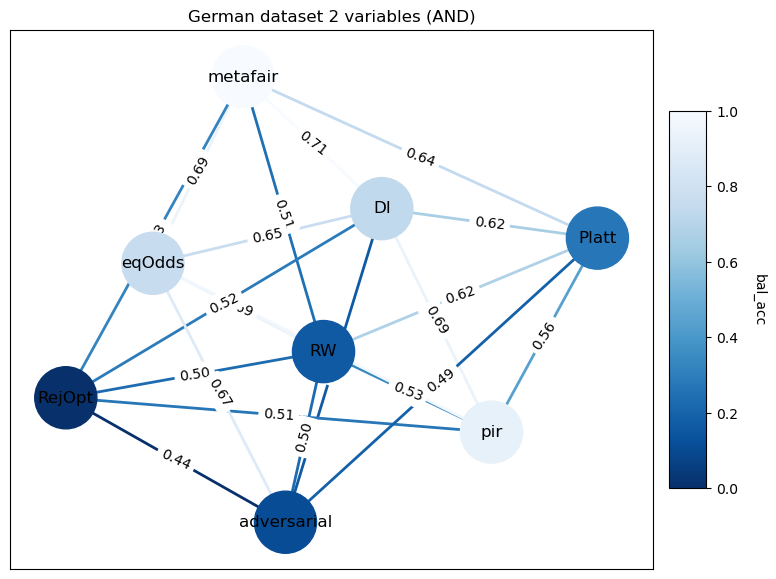

<Figure size 800x600 with 0 Axes>

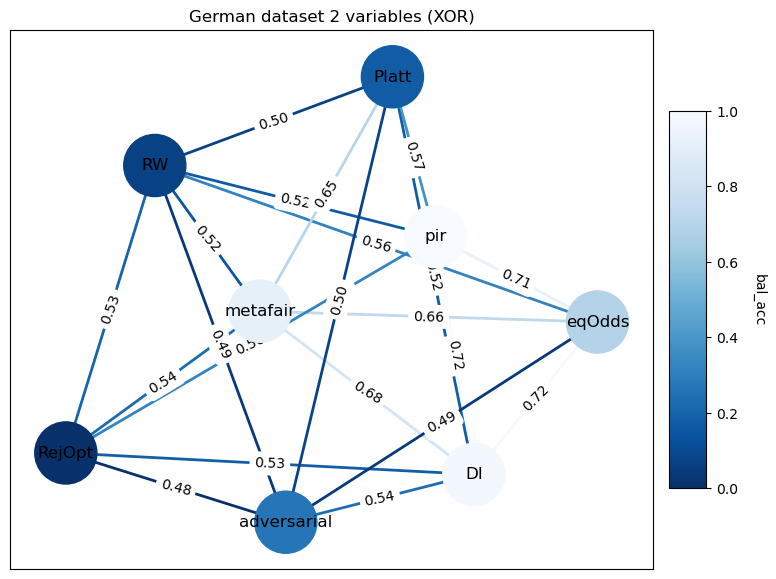

In [39]:
preproc = ['RW', 'DI']
inproc = ['metafair', 'pir', 'adversarial']
postproc = ['Platt', 'eqOdds', 'RejOpt']

proc = preproc + inproc + postproc

for metric in metrics:

    graph_visualization(resultsDict['Simulation']['Simulation1V_ind_1'], resultsDict['Simulation']['Simulation1V_com_1'], metric,
                                title = "Simulation 1 variable", name_end =  metric + "/Simulation1V")

    graph_visualization(resultsDict['Simulation']['Simulation2V_OR_ind_1'], resultsDict['Simulation']['Simulation2V_OR_com_1'], metric,
                                title = "Simulation 2 variables (OR)", name_end = metric + "/Simulation2V_OR")

    graph_visualization(resultsDict['Simulation']['Simulation2V_AND_ind_1'], resultsDict['Simulation']['Simulation2V_AND_com_1'], metric,
                                title = "Simulation 2 variables (AND)", name_end =  metric + "/Simulation2V_AND")

    graph_visualization(resultsDict['Simulation']['Simulation2V_XOR_ind_1'], resultsDict['Simulation']['Simulation2V_XOR_com_1'], metric,
                                title = "Simulation 2 variables (XOR)", name_end =  metric + "/Simulation2V_XOR")


    graph_visualization(resultsDict['German']['German1V_ind_1'], resultsDict['German']['German1V_com_1'], metric,
                                title = "German dataset 1 variable", name_end = metric + "/German1V")

    graph_visualization(resultsDict['German']['German2V_OR_ind_1'], resultsDict['German']['German2V_OR_com_1'], metric,
                                title = "German dataset 2 variables (OR)", name_end = metric + "/German2V_OR")

    graph_visualization(resultsDict['German']['German2V_AND_ind_1'], resultsDict['German']['German2V_AND_com_1'], metric,
                                title = "German dataset 2 variables (AND)", name_end = metric + "/German2V_AND")

    graph_visualization(resultsDict['German']['German2V_XOR_ind_1'], resultsDict['German']['German2V_XOR_com_1'], metric,
                                title = "German dataset 2 variables (XOR)", name_end = metric + "/German2V_XOR")
